# Load functions and data

In [ ]:
%load_ext autoreload
%autoreload 2
from analysis_imports_and_functions import *

print(os.getcwd())

mother_machine_data_pickle = "mother_machine_data_2025_11_27.pickle"
mother_machine_data = pd.read_pickle(mother_machine_data_pickle)
mother_machine_data

# Timepoint thresholds

In [2]:
# Set criteria for cells present at the start and end of the experiment (to remove empty trenches with segmentation artefacts & to act as a crude check for cells surviving at the end)
TRENCHES_FILE = "trenches.zarr"
MASKS_FILTERED_FILE = "masks_upscaled_filtered.zarr"

START_END_CONFIG = {
    'n_first':    {'min': 5, 'max': 50, 'step': 1,   'default': 20},
    'miss_first': {'min': 0, 'max': 20, 'step': 1,   'default': 2},
    'n_last':     {'min': 5, 'max': 50, 'step': 1,   'default': 30},
    'miss_last':  {'min': 0, 'max': 20, 'step': 1,   'default': 1} 
}

start_end_params = run_interactive_start_end_image_check(locals().get('mother_machine_data'), TRENCHES_FILE, MASKS_FILTERED_FILE, START_END_CONFIG, upscaled=True)

Loading images from:
 - trenches.zarr
 - masks_upscaled_filtered.zarr

 START/END PARAMS SAVED
n_first             : 20
miss_first          : 2
n_last              : 30
miss_last           : 1



In [5]:
# (Optional) Check at_start criteria looks good:
inspect_start_fails(locals().get('mother_machine_data'), locals().get('start_end_params'), TRENCHES_FILE, MASKS_FILTERED_FILE, START_END_CONFIG)

Identifying Start Failures...
 APPLYING START/END FLAGS 
Start Window: First 20 pts (Max 2 missing)
End Window:   Last  30 pts (Max 1 missing)
Unique mother_id counts — mother_machine_data: 38873, at_start: 26538, at_end: 23349, at_start & at_end: 21637
----------------------------------------
Found 12335 Start Failures. Launching viewer...
Loading images from:
 - trenches.zarr
 - masks_upscaled_filtered.zarr


{'n_first': 20, 'miss_first': 2, 'n_last': 30, 'miss_last': 1}


 START/END PARAMS SAVED
n_first             : 20
miss_first          : 2
n_last              : 30
miss_last           : 1
>> Updating 'params' variable in-place.



In [6]:
# (Optional) Check at_end criteria looks good:
inspect_end_fails(locals().get('mother_machine_data'), locals().get('start_end_params'), TRENCHES_FILE, MASKS_FILTERED_FILE, START_END_CONFIG)

Identifying End Failures...
 APPLYING START/END FLAGS 
Start Window: First 20 pts (Max 2 missing)
End Window:   Last  30 pts (Max 1 missing)
Unique mother_id counts — mother_machine_data: 38873, at_start: 26538, at_end: 23349, at_start & at_end: 21637
----------------------------------------
Found 15524 End Failures. Launching viewer...
Loading images from:
 - trenches.zarr
 - masks_upscaled_filtered.zarr


{'n_first': 20, 'miss_first': 2, 'n_last': 30, 'miss_last': 1}


 START/END PARAMS SAVED
n_first             : 20
miss_first          : 2
n_last              : 30
miss_last           : 1
>> Updating 'params' variable in-place.



In [3]:
# Run at_start & at_end criteria for all mother_ids
mother_machine_data = execute_batch_start_end_flags(locals().get('mother_machine_data'), locals().get('start_end_params'))

mother_machine_data

 APPLYING START/END FLAGS 
Start Window: First 20 pts (Max 2 missing)
End Window:   Last  30 pts (Max 1 missing)
Unique mother_id counts — mother_machine_data: 38873, at_start: 26538, at_end: 23349, at_start & at_end: 21637
----------------------------------------


,mother_id,timepoint,time,length,width,area,log_length,log_area,channel,intensity_raw,solidity,FOV_number,lane,condition,at_start,at_end
0,1,0,0,1.699821,1.168192,1.557665,0.530523,0.443188,PC,17302.495798,0.955823,0,0,Fresh media,True,True
1,1,1,3,1.553906,1.137151,1.387500,0.440772,0.327503,PC,15659.485849,0.954955,0,0,Fresh media,True,True
2,1,2,6,1.587528,1.183731,1.472582,0.462178,0.387017,PC,14906.520000,0.949367,0,0,Fresh media,True,True
3,1,3,9,1.754190,1.190290,1.636203,0.562007,0.492378,PC,17494.124000,0.965251,0,0,Fresh media,True,True
4,1,4,12,1.633718,1.147306,1.472582,0.490858,0.387017,PC,17292.062222,0.957447,0,0,Fresh media,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8722790,60417,316,948,4.457177,1.039464,3.527653,1.494516,1.260633,PC,22496.348794,0.967684,839,3,"50 μg/mL ampicillin, 1 hour",True,True
8722791,60417,317,951,1.219164,0.513382,0.464682,0.198165,-0.766403,PC,25842.098592,0.898734,839,3,"50 μg/mL ampicillin, 1 hour",True,True
8722792,60417,318,954,12.055174,1.107611,9.450706,2.489494,2.246089,PC,22504.790859,0.853428,839,3,"50 μg/mL ampicillin, 1 hour",True,True
8722793,60417,319,957,6.988702,1.040362,5.504185,1.944295,1.705509,PC,24697.387634,0.928256,839,3,"50 μg/mL ampicillin, 1 hour",True,True


# Cell growth trace initial cleanup

In [16]:
"""
================================================================================
                        GROWTH TRACE CLEANING PIPELINE
================================================================================

This pipeline applies 4 filters sequentially to clean cell growth traces.
The "mother_machine_data" DataFrame is filtered in the following order:

1. HARD AREA FILTER
   - Logic: Rejects ANY timepoint where area < 'hard_min'.
   - 'hard_min': Minimum area threshold (microns^2) allowed for any point.

2. GATED AREA FILTER
   - Logic: Finds the first sequence of 'gate_len' frames where area >= 'gated_min'.
     Rejects any point AFTER this gate opens if area < 'gated_min'.
   - 'gated_min': Area threshold applied only after the cell passes the gate check.
   - 'gate_len': Number of consecutive frames above 'gated_min' required to open the gate.

3. SPIKE FILTER
   - Logic: Rejects length spikes where length jumps UP by >= 'spike_fc' 
     and then DOWN by >= 'spike_fc' within 'spike_gap' frames.
   - 'spike_fc': Fold change threshold (e.g., 2.0 means doubling/halving).
   - 'spike_gap': Maximum frames allowed between the UP jump and the DOWN jump.

4. GRADIENT FILTER
   - Logic: Iteratively removes points creating a positive slope > 'grad_max'.
     It bridges gaps up to 'grad_gap' frames to check the gradient.
   - 'grad_max': Maximum allowed positive gradient (slope of ln(length) vs time).
   - 'grad_gap': Maximum frames to look back when calculating gradient.

================================================================================
"""

# -- PARAMETER CONFIGURATION ---------------------------------------------------
# min/max: slider range, step: slider interval, default: default value
CLEANING_CONFIG = {
    # 1. Hard Area Filter
    'hard_min':  {'min': 0.5, 'max': 3.0, 'step': 0.01,  'default': 0.87},
    
    # 2. Gated Area Filter
    'gated_min': {'min': 0.5, 'max': 3.0, 'step': 0.01,  'default': 1.34},
    'gate_len':  {'min': 0,   'max': 20,  'step': 1,     'default': 10},
    
    # 3. Spike Filter (Now Split Up/Down)
    'spike_fc_up':   {'min': 1.0, 'max': 3.0, 'step': 0.1,   'default': 1.6},
    'spike_fc_down': {'min': 1.0, 'max': 3.0, 'step': 0.1,   'default': 1.4},
    'spike_gap':     {'min': 0,   'max': 5,   'step': 1,     'default': 3},
    
    # 4. Gradient Filter
    'grad_max':  {'min': 0.0, 'max': 0.1, 'step': 0.001, 'default': 0.046},
    'grad_gap':  {'min': 0,   'max': 10,  'step': 1,     'default': 3}
}


# -- EXECUTION --
cleaning_params = launch_interactive_cleaning(locals().get('mother_machine_data'), CLEANING_CONFIG)

Loaded 38873 traces.


In [5]:
# Run growth trace cleanup for all mother_ids using saved parameters
num_IDs_to_plot_per_lane = 50  # Set to False to plot all mother_ids

mother_machine_data = execute_batch_cleaning(locals().get('mother_machine_data'), locals().get('cleaning_params'), num_IDs_to_plot_per_lane=num_IDs_to_plot_per_lane)

mother_machine_data

 STARTING BATCH CLEANING 
Report: growth_traces_cleaned_2025_11_27_40x_persister_1HourAmpicillinTreatments_20260111_144359.pdf
Step 1: Preparing Data and Applying Filters...


Processing Growth Trace Cleaning:   0%|          | 0/38873 [00:00<?, ?it/s]

Cleaning Complete. 2084846 points removed.
Sampling ~50 mothers per lane for the PDF report...
Step 2: Generating PDF Report...
PDF Report saved to: growth_traces_cleaned_2025_11_27_40x_persister_1HourAmpicillinTreatments_20260111_144359.pdf
 DONE 


,mother_id,timepoint,time,length,width,area,log_length,log_area,channel,intensity_raw,solidity,FOV_number,lane,condition,at_start,at_end,log_length_cleaned
0,1,0,0,1.699821,1.168192,1.557665,0.530523,0.443188,PC,17302.495798,0.955823,0,0,Fresh media,True,True,0.530523
1,1,1,3,1.553906,1.137151,1.387500,0.440772,0.327503,PC,15659.485849,0.954955,0,0,Fresh media,True,True,0.440772
2,1,2,6,1.587528,1.183731,1.472582,0.462178,0.387017,PC,14906.520000,0.949367,0,0,Fresh media,True,True,0.462178
3,1,3,9,1.754190,1.190290,1.636203,0.562007,0.492378,PC,17494.124000,0.965251,0,0,Fresh media,True,True,0.562007
4,1,4,12,1.633718,1.147306,1.472582,0.490858,0.387017,PC,17292.062222,0.957447,0,0,Fresh media,True,True,0.490858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8722790,60417,316,948,4.457177,1.039464,3.527653,1.494516,1.260633,PC,22496.348794,0.967684,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN
8722791,60417,317,951,1.219164,0.513382,0.464682,0.198165,-0.766403,PC,25842.098592,0.898734,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN
8722792,60417,318,954,12.055174,1.107611,9.450706,2.489494,2.246089,PC,22504.790859,0.853428,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN
8722793,60417,319,957,6.988702,1.040362,5.504185,1.944295,1.705509,PC,24697.387634,0.928256,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN


In [6]:
# Identify division events (basic 1st pass, we re-do this later after extra smoothing steps)
DIV_CONFIG = {
    'prominence': {'min': 0.0, 'max': 0.2, 'step': 0.005, 'default': 0.100},
    'min_dist':   {'min': 0,   'max': 60,  'step': 1,    'default': 12},
    'drop_min':   {'min': 0.0, 'max': 1.0, 'step': 0.05, 'default': 0.35}, 
    'drop_max':   {'min': 0.0, 'max': 10.0,'step': 0.1,  'default': 1.1}
}

div_params = launch_interactive_division_testing(locals().get('mother_machine_data'), DIV_CONFIG)

Loaded 38873 traces.

 DIVISION PARAMETERS SAVED
peak_prominence          : 0.1
min_division_interval    : 12
drop_min                 : 0.35
drop_max                 : 1.1



In [7]:
# Run division event identification for all mother_ids
mother_machine_data = execute_batch_division_detection(locals().get('mother_machine_data'), locals().get('div_params'))

mother_machine_data

 STARTING DIVISION DETECTION 
Step 1: Detecting Division Events...


Processing Division Event Identification:   0%|          | 0/38873 [00:00<?, ?it/s]

Detection Complete. Flagged 387086 unique division events (across all channels).
 DONE 


,mother_id,timepoint,time,length,width,area,log_length,log_area,channel,intensity_raw,solidity,FOV_number,lane,condition,at_start,at_end,log_length_cleaned,division_event
0,1,0,0,1.699821,1.168192,1.557665,0.530523,0.443188,PC,17302.495798,0.955823,0,0,Fresh media,True,True,0.530523,False
1,1,1,3,1.553906,1.137151,1.387500,0.440772,0.327503,PC,15659.485849,0.954955,0,0,Fresh media,True,True,0.440772,False
2,1,2,6,1.587528,1.183731,1.472582,0.462178,0.387017,PC,14906.520000,0.949367,0,0,Fresh media,True,True,0.462178,False
3,1,3,9,1.754190,1.190290,1.636203,0.562007,0.492378,PC,17494.124000,0.965251,0,0,Fresh media,True,True,0.562007,False
4,1,4,12,1.633718,1.147306,1.472582,0.490858,0.387017,PC,17292.062222,0.957447,0,0,Fresh media,True,True,0.490858,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8722790,60417,316,948,4.457177,1.039464,3.527653,1.494516,1.260633,PC,22496.348794,0.967684,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False
8722791,60417,317,951,1.219164,0.513382,0.464682,0.198165,-0.766403,PC,25842.098592,0.898734,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False
8722792,60417,318,954,12.055174,1.107611,9.450706,2.489494,2.246089,PC,22504.790859,0.853428,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False
8722793,60417,319,957,6.988702,1.040362,5.504185,1.944295,1.705509,PC,24697.387634,0.928256,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False


# Extensive data cleanup, division event identification, growth rate identification, slowdown event identification

In [8]:
# Set growth trace smoothing criteria
SMOOTHING_CONFIG = {
    'lowess_window':       {'min': 0, 'max': 50, 'step': 2, 'default': 8},
    'lowess_window_early': {'min': 0, 'max': 50, 'step': 2, 'default': 14}, # extra smoothing at the start (if cells start in stationary phase), where cells are small and segmentation is more variable
    'early_time_lim':      {'min': 0, 'max': 600, 'step': 10, 'default': 100}
}
ZOOM_XLIMS = (200, 400) # zoom in to check that "division event flattening" is working as expected

smoothing_params = run_interactive_smoothing(locals().get('mother_machine_data'), config=SMOOTHING_CONFIG, zoom_xlims=ZOOM_XLIMS)

Loaded 26538 candidates for smoothing check.
Saved Params:
  Main Window: 8
  Early Window: 14
  Early Limit: 100.0


In [9]:
# Process growth trace smoothing for all mother_ids
mother_machine_data = execute_batch_smoothing(locals().get('mother_machine_data'), smoothing_params)

mother_machine_data

 STARTING BATCH SMOOTHING (Parallel n_jobs=31) 
  Main Window:  8 pts
  Early Window: 14 pts
  Early Limit:  100.0 mins
Processing 26538 mother_ids...


Smoothing growth traces:   0%|          | 0/26538 [00:00<?, ?it/s]

Concatenating results...
 DONE 


,mother_id,timepoint,time,length,width,area,log_length,log_area,channel,intensity_raw,solidity,FOV_number,lane,condition,at_start,at_end,log_length_cleaned,division_event,log_length_smoothed
0,1,0,0,1.699821,1.168192,1.557665,0.530523,0.443188,PC,17302.495798,0.955823,0,0,Fresh media,True,True,0.530523,False,0.482549
1,1,1,3,1.553906,1.137151,1.387500,0.440772,0.327503,PC,15659.485849,0.954955,0,0,Fresh media,True,True,0.440772,False,0.481250
2,1,2,6,1.587528,1.183731,1.472582,0.462178,0.387017,PC,14906.520000,0.949367,0,0,Fresh media,True,True,0.462178,False,0.480243
3,1,3,9,1.754190,1.190290,1.636203,0.562007,0.492378,PC,17494.124000,0.965251,0,0,Fresh media,True,True,0.562007,False,0.479000
4,1,4,12,1.633718,1.147306,1.472582,0.490858,0.387017,PC,17292.062222,0.957447,0,0,Fresh media,True,True,0.490858,False,0.478150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8722790,60417,316,948,4.457177,1.039464,3.527653,1.494516,1.260633,PC,22496.348794,0.967684,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False,1.934375
8722791,60417,317,951,1.219164,0.513382,0.464682,0.198165,-0.766403,PC,25842.098592,0.898734,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False,2.069618
8722792,60417,318,954,12.055174,1.107611,9.450706,2.489494,2.246089,PC,22504.790859,0.853428,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False,2.204862
8722793,60417,319,957,6.988702,1.040362,5.504185,1.944295,1.705509,PC,24697.387634,0.928256,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False,2.340106


In [20]:
# Set parameters for identifying missing division events
# (lean towards trying to identify almost all real division events for clean traces, artefacts for messy traces aren't a big deal as these traces will likely be discarded later)
MISSING_DIV_CONFIG = {
    'prominence':                {'min': 0.0, 'max': 0.2, 'step': 0.005, 'default': 0.150},
    'min_dist':                  {'min': 0,   'max': 60,  'step': 3,     'default': 12   },
    'drop_min':                  {'min': 0.0, 'max': 1.0, 'step': 0.01,  'default': 0.12 }, 
    'drop_max':                  {'min': 0.0, 'max': 10.0,'step': 0.1,   'default': 0.4  },
    'division_timepoint_window': {'min': 0,   'max': 30,  'step': 3,     'default': 15   },
    'division_peak_lookback':    {'min': 1,   'max': 5,   'step': 1,     'default': 5    }
}

missing_div_params = run_interactive_missing_divisions(locals().get('mother_machine_data'), config=MISSING_DIV_CONFIG)

Saved Missing Div Params: {'prominence': 0.15, 'min_dist': 12, 'drop_min': 0.12, 'drop_max': 0.4, 'snap_enabled': True, 'division_timepoint_window': 15, 'division_peak_lookback': 5}


In [11]:
# Process missing division event identification for all mother_ids
mother_machine_data = execute_batch_missing_divisions(locals().get('mother_machine_data'), missing_div_params)

mother_machine_data

 FINDING MISSING DIVISIONS (Parallel n_jobs=31) 
  Params: {'prominence': 0.15, 'min_dist': 12, 'drop_min': 0.12, 'drop_max': 0.4, 'snap_enabled': True, 'division_timepoint_window': 15, 'division_peak_lookback': 5}
Processing 26538 mother_ids...


Identifying missing division events:   0%|          | 0/26538 [00:00<?, ?it/s]

Added 46443 new division events.
 DONE 


,mother_id,timepoint,time,length,width,area,log_length,log_area,channel,intensity_raw,solidity,FOV_number,lane,condition,at_start,at_end,log_length_cleaned,division_event,log_length_smoothed
0,1,0,0,1.699821,1.168192,1.557665,0.530523,0.443188,PC,17302.495798,0.955823,0,0,Fresh media,True,True,0.530523,False,0.482549
1,1,1,3,1.553906,1.137151,1.387500,0.440772,0.327503,PC,15659.485849,0.954955,0,0,Fresh media,True,True,0.440772,False,0.481250
2,1,2,6,1.587528,1.183731,1.472582,0.462178,0.387017,PC,14906.520000,0.949367,0,0,Fresh media,True,True,0.462178,False,0.480243
3,1,3,9,1.754190,1.190290,1.636203,0.562007,0.492378,PC,17494.124000,0.965251,0,0,Fresh media,True,True,0.562007,False,0.479000
4,1,4,12,1.633718,1.147306,1.472582,0.490858,0.387017,PC,17292.062222,0.957447,0,0,Fresh media,True,True,0.490858,False,0.478150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8722790,60417,316,948,4.457177,1.039464,3.527653,1.494516,1.260633,PC,22496.348794,0.967684,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False,1.934375
8722791,60417,317,951,1.219164,0.513382,0.464682,0.198165,-0.766403,PC,25842.098592,0.898734,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False,2.069618
8722792,60417,318,954,12.055174,1.107611,9.450706,2.489494,2.246089,PC,22504.790859,0.853428,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False,2.204862
8722793,60417,319,957,6.988702,1.040362,5.504185,1.944295,1.705509,PC,24697.387634,0.928256,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False,2.340106


In [12]:
# Remove division events (artefacts) that are identified impossibly early
min_division_event_time = 60 # minutes
mother_machine_data.loc[mother_machine_data["time"] < min_division_event_time, "division_event"] = False

In [21]:
# Re-do smoothing with new division events
SMOOTHING_CONFIG = {
    'lowess_window':       {'min': 0, 'max': 50, 'step': 2, 'default': 8},
    'lowess_window_early': {'min': 0, 'max': 50, 'step': 2, 'default': 14}, # extra smoothing at the start (if cells start in stationary phase), where cells are small and segmentation is more variable
    'early_time_lim':      {'min': 0, 'max': 600, 'step': 10, 'default': 100}
}
ZOOM_XLIMS = (200, 400) # zoom in to check that "division event flattening" is working as expected

smoothing_params = run_interactive_smoothing(locals().get('mother_machine_data'), config=SMOOTHING_CONFIG, zoom_xlims=ZOOM_XLIMS)

Loaded 26538 candidates for smoothing check.
Saved Params:
  Main Window: 8
  Early Window: 14
  Early Limit: 100.0


In [22]:
# Re-run growth trace smoothing for all mother_ids (with new division events)
mother_machine_data = execute_batch_smoothing(locals().get('mother_machine_data'), smoothing_params)

mother_machine_data

 STARTING BATCH SMOOTHING (Parallel n_jobs=31) 
  Main Window:  8 pts
  Early Window: 14 pts
  Early Limit:  100.0 mins
Processing 26538 mother_ids...


Smoothing growth traces:   0%|          | 0/26538 [00:00<?, ?it/s]

Concatenating results...
 DONE 


,mother_id,timepoint,time,length,width,area,log_length,log_area,channel,intensity_raw,solidity,FOV_number,lane,condition,at_start,at_end,log_length_cleaned,division_event,log_length_smoothed
0,1,0,0,1.699821,1.168192,1.557665,0.530523,0.443188,PC,17302.495798,0.955823,0,0,Fresh media,True,True,0.530523,False,0.482967
1,1,1,3,1.553906,1.137151,1.387500,0.440772,0.327503,PC,15659.485849,0.954955,0,0,Fresh media,True,True,0.440772,False,0.481595
2,1,2,6,1.587528,1.183731,1.472582,0.462178,0.387017,PC,14906.520000,0.949367,0,0,Fresh media,True,True,0.462178,False,0.480513
3,1,3,9,1.754190,1.190290,1.636203,0.562007,0.492378,PC,17494.124000,0.965251,0,0,Fresh media,True,True,0.562007,False,0.479191
4,1,4,12,1.633718,1.147306,1.472582,0.490858,0.387017,PC,17292.062222,0.957447,0,0,Fresh media,True,True,0.490858,False,0.478263
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8722790,60417,316,948,4.457177,1.039464,3.527653,1.494516,1.260633,PC,22496.348794,0.967684,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False,1.934375
8722791,60417,317,951,1.219164,0.513382,0.464682,0.198165,-0.766403,PC,25842.098592,0.898734,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False,2.069618
8722792,60417,318,954,12.055174,1.107611,9.450706,2.489494,2.246089,PC,22504.790859,0.853428,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False,2.204862
8722793,60417,319,957,6.988702,1.040362,5.504185,1.944295,1.705509,PC,24697.387634,0.928256,839,3,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False,2.340106


In [23]:
# Set growth rate and second deriv smoothing criteria
DERIV_CONFIG = {
    'lowess_window_first_deriv':  {'min': 0, 'max': 50, 'step': 2, 'default': 24},
    'lowess_window_second_deriv': {'min': 0, 'max': 50, 'step': 2, 'default': 12}
}

deriv_params = run_interactive_derivative_smoothing(locals().get('mother_machine_data'), config=DERIV_CONFIG)

Saved Deriv Params: {'lowess_window_first_deriv': 24, 'lowess_window_second_deriv': 12}


In [24]:
# Set growth rate and second deriv cleanup criteria
DERIV_CLEANUP_CONFIG = {
    # First Derivative (Growth Rate) - scaled by 10^-2
    'min_d1': {'min': -0.5, 'max': 0.5,  'step': 0.01, 'default': 0.00}, 
    'max_d1': {'min': 0.0,  'max': 10.0, 'step': 0.1,  'default': 3.5}, 
    'adj_d1': {'min': 0,    'max': 5,    'step': 1,    'default': 0},
    # Second Derivative - scaled by 10^-4
    'min_d2': {'min': -4.5, 'max': 0.5,  'step': 0.1,  'default': -2.5}, 
    'max_d2': {'min': 0.0,  'max': 10.0, 'step': 0.1,  'default': 3.5}, 
    'adj_d2': {'min': 0,    'max': 5,    'step': 1,    'default': 0}
}

cleanup_params = run_interactive_derivative_cleanup(locals().get('mother_machine_data'), config=DERIV_CLEANUP_CONFIG, prev_deriv_params=locals().get('deriv_params'))

Saved Cleanup Params: {'use_d1': True, 'min_d1': 0.0, 'max_d1': 0.035, 'adj_d1': 0, 'use_d2': True, 'min_d2': -0.00025, 'max_d2': 0.00035, 'adj_d2': 0}


In [25]:
# Process first and second deriv smoothing & cleanup for all mother_ids
# Creates growth_rate and second_derivative columns with the filtered raw timepoints & growth_rate_smoothed and second_deriv_smoothed for LOWESS-smoothed fit data
mother_machine_data = execute_batch_derivative_cleanup(locals().get('mother_machine_data'), cleanup_params, locals().get('deriv_params'))

mother_machine_data

 STARTING BATCH CLEANUP (Parallel n_jobs=31) 
  Params: {'use_d1': True, 'min_d1': 0.0, 'max_d1': 0.035, 'adj_d1': 0, 'use_d2': True, 'min_d2': -0.00025, 'max_d2': 0.00035, 'adj_d2': 0}
Processing 26538 mother_ids...


Cleaning derivatives:   0%|          | 0/26538 [00:00<?, ?it/s]

Concatenating results...
 DONE 


,mother_id,timepoint,time,length,width,area,log_length,log_area,channel,intensity_raw,...,condition,at_start,at_end,log_length_cleaned,division_event,log_length_smoothed,growth_rate,second_deriv,growth_rate_smoothed,second_deriv_smoothed
0,1,0,0,1.699821,1.168192,1.557665,0.530523,0.443188,PC,17302.495798,...,Fresh media,True,True,0.530523,False,0.482967,NaN,NaN,0.003604,-0.000017
1,1,1,3,1.553906,1.137151,1.387500,0.440772,0.327503,PC,15659.485849,...,Fresh media,True,True,0.440772,False,0.481595,NaN,NaN,0.003604,0.000009
2,1,2,6,1.587528,1.183731,1.472582,0.462178,0.387017,PC,14906.520000,...,Fresh media,True,True,0.462178,False,0.480513,NaN,NaN,0.003604,0.000035
3,1,3,9,1.754190,1.190290,1.636203,0.562007,0.492378,PC,17494.124000,...,Fresh media,True,True,0.562007,False,0.479191,NaN,NaN,0.003604,0.000060
4,1,4,12,1.633718,1.147306,1.472582,0.490858,0.387017,PC,17292.062222,...,Fresh media,True,True,0.490858,False,0.478263,0.000936,0.000093,0.003604,0.000085
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8722790,60417,316,948,4.457177,1.039464,3.527653,1.494516,1.260633,PC,22496.348794,...,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False,1.934375,NaN,NaN,0.031482,0.000000
8722791,60417,317,951,1.219164,0.513382,0.464682,0.198165,-0.766403,PC,25842.098592,...,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False,2.069618,NaN,NaN,0.031482,0.000000
8722792,60417,318,954,12.055174,1.107611,9.450706,2.489494,2.246089,PC,22504.790859,...,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False,2.204862,NaN,NaN,0.031482,0.000000
8722793,60417,319,957,6.988702,1.040362,5.504185,1.944295,1.705509,PC,24697.387634,...,"50 μg/mL ampicillin, 1 hour",True,True,NaN,False,2.340106,NaN,NaN,0.031482,0.000000


In [27]:
# Set parameters for identifying final timepoints (based on % of subsequent growth_rate NaN timepoints), sets all subsequent timepoints (artefacts/messy traces) to NaN
FINAL_CHECK_CONFIG = {
    'max_window_nan_pct':     {'min': 0.0, 'max': 100.0, 'step': 1.0, 'default': 85.0},
    'window_length':        {'min': 0,   'max': 600,   'step': 3,   'default': 80},
    'window_fold_decrease': {'min': 1.1, 'max': 10.0,  'step': 0.1, 'default': 2.0} # window size fold decrease per cycle, shouldn't actually affect the result
}

check_params = run_final_timepoint_check_viewer(locals().get('mother_machine_data'), config=FINAL_CHECK_CONFIG)

Saved Final Check Params: {'max_window_nan_pct': 85.0, 'window_length': 80, 'window_fold_decrease': 2.0}


In [28]:
# Process final timepoint identification for all mother_ids
mother_machine_data = execute_batch_final_timepoint_check(locals().get('mother_machine_data'), check_params)

mother_machine_data

 EXECUTING FINAL TIMEPOINT CHECK (Parallel n_jobs=31) 
  Params: {'max_window_nan_pct': 85.0, 'window_length': 80, 'window_fold_decrease': 2.0}
Processing 26538 mother_ids...


Identifying final timepoints:   0%|          | 0/26538 [00:00<?, ?it/s]

Applying cutoffs and masking data...
Masking 2264870 timepoints across 26538 traces.
 DONE 


,mother_id,timepoint,time,length,width,area,log_length,log_area,channel,intensity_raw,...,at_start,at_end,log_length_cleaned,division_event,log_length_smoothed,growth_rate,second_deriv,growth_rate_smoothed,second_deriv_smoothed,final_time
0,1,0,0,1.699821,1.168192,1.557665,0.530523,0.443188,PC,17302.495798,...,True,True,0.530523,False,0.482967,NaN,NaN,0.003604,-0.000017,NaN
1,1,1,3,1.553906,1.137151,1.387500,0.440772,0.327503,PC,15659.485849,...,True,True,0.440772,False,0.481595,NaN,NaN,0.003604,0.000009,NaN
2,1,2,6,1.587528,1.183731,1.472582,0.462178,0.387017,PC,14906.520000,...,True,True,0.462178,False,0.480513,NaN,NaN,0.003604,0.000035,NaN
3,1,3,9,1.754190,1.190290,1.636203,0.562007,0.492378,PC,17494.124000,...,True,True,0.562007,False,0.479191,NaN,NaN,0.003604,0.000060,NaN
4,1,4,12,1.633718,1.147306,1.472582,0.490858,0.387017,PC,17292.062222,...,True,True,0.490858,False,0.478263,0.000936,0.000093,0.003604,0.000085,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8722790,60417,316,948,4.457177,1.039464,3.527653,1.494516,1.260633,PC,22496.348794,...,True,True,NaN,False,NaN,NaN,NaN,NaN,NaN,0.0
8722791,60417,317,951,1.219164,0.513382,0.464682,0.198165,-0.766403,PC,25842.098592,...,True,True,NaN,False,NaN,NaN,NaN,NaN,NaN,0.0
8722792,60417,318,954,12.055174,1.107611,9.450706,2.489494,2.246089,PC,22504.790859,...,True,True,NaN,False,NaN,NaN,NaN,NaN,NaN,0.0
8722793,60417,319,957,6.988702,1.040362,5.504185,1.944295,1.705509,PC,24697.387634,...,True,True,NaN,False,NaN,NaN,NaN,NaN,NaN,0.0


In [29]:
SLOWDOWN_TEST_CONFIG = {
    # Trigger: Min Dip Area (Area Under Zero)
    'min_dip_area':        {'min': 0, 'max': 100, 'step': 1, 'default': 45},  # x10^-4
    # Recovery: Factor of Dip Area needed Above Zero to end event
    'recovery_factor':     {'min': 0, 'max': 3.0,  'step': 0.05, 'default': 0.75},
    # Baseline (Fast) Growth Rate Calculation
    'baseline_window_min': {'min': 3,   'max': 120, 'step': 3,   'default': 60},
    'baseline_metric':     'Median', # 'Mean' or 'Median'
    'max_baseline':        {'min': 0.5, 'max': 3.0, 'step': 0.1, 'default': 2.0}, # x10^-2
    
    # Snapping points to curve
    'snap_window_min':     {'min': 0, 'max': 120, 'step': 3, 'default': 72}
}

slowdown_params = run_interactive_slowdown_tester(locals().get('mother_machine_data'), config=SLOWDOWN_TEST_CONFIG)

Saved Params: {'min_dip_area': 45.0, 'recovery_factor': 0.75, 'baseline_window_min': 60, 'baseline_metric': 'Median', 'max_baseline': 2.0, 'snap_timings_to_curve': True, 'snap_window_min': 72}


In [30]:
mother_machine_data = execute_batch_slowdown_detection(locals().get('mother_machine_data'), slowdown_params)

mother_machine_data

 EXECUTING BATCH SLOWDOWN DETECTION 
Processing 26538 mothers...


Detecting slowdowns:   0%|          | 0/26538 [00:00<?, ?it/s]

Applying annotations...
Annotated 2174607 timepoints in slowdown regions.
 DONE 


,mother_id,timepoint,time,length,width,area,log_length,log_area,channel,intensity_raw,...,second_deriv,growth_rate_smoothed,second_deriv_smoothed,final_time,slowdown,slowdown_interval,current_slowdown_duration,total_slowdown_duration,current_lost_time,total_lost_time
0,1,0,0,1.699821,1.168192,1.557665,0.530523,0.443188,PC,17302.495798,...,NaN,0.003604,-0.000017,NaN,False,None,NaN,NaN,NaN,NaN
1,1,1,3,1.553906,1.137151,1.387500,0.440772,0.327503,PC,15659.485849,...,NaN,0.003604,0.000009,NaN,False,None,NaN,NaN,NaN,NaN
2,1,2,6,1.587528,1.183731,1.472582,0.462178,0.387017,PC,14906.520000,...,NaN,0.003604,0.000035,NaN,False,None,NaN,NaN,NaN,NaN
3,1,3,9,1.754190,1.190290,1.636203,0.562007,0.492378,PC,17494.124000,...,NaN,0.003604,0.000060,NaN,False,None,NaN,NaN,NaN,NaN
4,1,4,12,1.633718,1.147306,1.472582,0.490858,0.387017,PC,17292.062222,...,0.000093,0.003604,0.000085,NaN,False,None,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8722790,60417,316,948,4.457177,1.039464,3.527653,1.494516,1.260633,PC,22496.348794,...,NaN,NaN,NaN,0.0,False,None,NaN,NaN,NaN,NaN
8722791,60417,317,951,1.219164,0.513382,0.464682,0.198165,-0.766403,PC,25842.098592,...,NaN,NaN,NaN,0.0,False,None,NaN,NaN,NaN,NaN
8722792,60417,318,954,12.055174,1.107611,9.450706,2.489494,2.246089,PC,22504.790859,...,NaN,NaN,NaN,0.0,False,None,NaN,NaN,NaN,NaN
8722793,60417,319,957,6.988702,1.040362,5.504185,1.944295,1.705509,PC,24697.387634,...,NaN,NaN,NaN,0.0,False,None,NaN,NaN,NaN,NaN


In [31]:
# N.B. the code currently assumes that all lanes are either treatment during exponential phase, or treatment during wakeup from stationary phase; if the lanes contain a combination of both, will need to tweak the code a bit

## Pre-treatment division event identification (skip if treament started from stationary phase, i.e. no growth before treatment starts)

In [32]:
# Set "growing_before" cell criteria (to exclude segementation artefacts/very blurry image traces from at_start cells)
T2 = 7*60 + 12 # growth region to check end
T1 = T2 - 4*60 # growth region to check start

GROWTH_BEFORE_CONFIG = {
    'min_divs':    {'min': 0, 'max': 10, 'step': 1, 'default': 2},
    'max_nan_pct': {'min': 0, 'max': 50, 'step': 0.5, 'default': 22.5}
}

growth_params = launch_interactive_growth_testing(locals().get('mother_machine_data'), T1, T2, GROWTH_BEFORE_CONFIG)

Loaded 47059 traces.
Checking Window: 192 min -> 432 min
Growth Params Saved: {'t1': 192, 't2': 432, 'min_division_events': 2, 'max_missing_timepoints_fraction': 22.5}


In [33]:
# Process growing_before criteria for all mother_ids
mother_machine_data = execute_batch_growth_classification(locals().get('mother_machine_data'), locals().get('growth_params'))

mother_machine_data

 STARTING GROWTH CLASSIFICATION (Parallel) 
Processing 47059 mother_ids in window [192, 432]...


Classifying growing_before:   0%|          | 0/47059 [00:00<?, ?it/s]

Classification Complete. 31313/47059 (66.5%) mothers classified as Growing.
 DONE 


,mother_id,timepoint,time,length,width,area,log_length,log_area,channel,intensity_raw,...,growth_rate_smoothed,second_deriv_smoothed,final_time,slowdown,slowdown_interval,current_slowdown_duration,total_slowdown_duration,current_lost_time,total_lost_time,growing_before
0,0,0,0,4.250920,1.147024,3.704362,1.447135,1.309511,PC,17662.097173,...,NaN,NaN,NaN,False,None,NaN,NaN,NaN,NaN,False
1,0,1,3,1.846160,0.917422,1.236969,0.613108,0.212664,PC,18419.640212,...,NaN,NaN,NaN,False,None,NaN,NaN,NaN,NaN,False
2,0,2,6,1.587686,0.672614,0.818101,0.462278,-0.200769,PC,21514.792000,...,NaN,NaN,NaN,False,None,NaN,NaN,NaN,NaN,False
3,0,3,9,1.807836,0.805333,1.092983,0.592131,0.088911,PC,20275.808383,...,NaN,NaN,NaN,False,None,NaN,NaN,NaN,NaN,False
4,0,4,12,3.123144,1.308836,2.840448,1.138840,1.043962,PC,21580.642857,...,NaN,NaN,NaN,False,None,NaN,NaN,NaN,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13494643,60034,395,1185,4.620733,1.061211,3.795990,1.530553,1.333945,PC,12306.041379,...,NaN,NaN,15.0,False,None,NaN,NaN,NaN,NaN,False
13494644,60034,396,1188,3.734199,1.094397,3.174233,1.317533,1.155066,PC,11865.222680,...,NaN,NaN,15.0,False,None,NaN,NaN,NaN,NaN,False
13494645,60034,397,1191,3.889112,1.062558,3.180778,1.358181,1.157126,PC,10935.111111,...,NaN,NaN,15.0,False,None,NaN,NaN,NaN,NaN,False
13494646,60034,398,1194,1.091472,0.833827,0.687205,0.087527,-0.375123,PC,9498.228571,...,NaN,NaN,15.0,False,None,NaN,NaN,NaN,NaN,False


## Post-treatment division event identification

In [31]:
# Set "growing_after" cell criteria (to exclude segementation artefacts/very blurry image traces from surviving at_end cells)

T4 = mother_machine_data["time"].max() # growth region to check end
T3 = T4 - 6*60                         # growth region to check start

# For easier/quicker analysis, stricter thresholds (e.g. >3-5  divisions, <15-20% NaNs within final 6 hours) will minimise false-positives, at the expense of missing some real events
# To catch most of the edge cases, more relaxed thresholds (e.g. >1-2 divisions, <30-40% NaNs within final 6 hours) are preferable; false positives can be manually discarded later
GROWTH_AFTER_CONFIG = {
    'min_divs':    {'min': 0, 'max': 10, 'step': 1, 'default': 2},
    'max_nan_pct': {'min': 0, 'max': 50, 'step': 0.5, 'default': 30}
}

post_growth_params = launch_interactive_post_growth_testing(locals().get('mother_machine_data'),  T3,  T4, GROWTH_AFTER_CONFIG)

Saved Post-Growth Params: {'min_divs': 2, 'max_nan_pct': 30.0, 't3': 600, 't4': 960}


In [32]:
# Process growing_after criteria for all mother_ids
mother_machine_data = execute_batch_post_growth_classification(locals().get('mother_machine_data'), locals().get('post_growth_params'))

mother_machine_data

 CLASSIFYING GROWING_AFTER (Parallel) 
Processing 26538 mother_ids in window [600.0, 960.0]...


Classifying growing_after:   0%|          | 0/26538 [00:00<?, ?it/s]

Applying classifications...
Done. Approximately 3804901 mothers classified as 'growing_after'.


,mother_id,timepoint,time,length,width,area,log_length,log_area,channel,intensity_raw,...,growth_rate_smoothed,second_deriv_smoothed,final_time,slowdown,slowdown_interval,current_slowdown_duration,total_slowdown_duration,current_lost_time,total_lost_time,growing_after
0,1,0,0,1.699821,1.168192,1.557665,0.530523,0.443188,PC,17302.495798,...,0.003604,-0.000017,NaN,False,None,NaN,NaN,NaN,NaN,False
1,1,1,3,1.553906,1.137151,1.387500,0.440772,0.327503,PC,15659.485849,...,0.003604,0.000009,NaN,False,None,NaN,NaN,NaN,NaN,False
2,1,2,6,1.587528,1.183731,1.472582,0.462178,0.387017,PC,14906.520000,...,0.003604,0.000035,NaN,False,None,NaN,NaN,NaN,NaN,False
3,1,3,9,1.754190,1.190290,1.636203,0.562007,0.492378,PC,17494.124000,...,0.003604,0.000060,NaN,False,None,NaN,NaN,NaN,NaN,False
4,1,4,12,1.633718,1.147306,1.472582,0.490858,0.387017,PC,17292.062222,...,0.003604,0.000085,NaN,False,None,NaN,NaN,NaN,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8722790,60417,316,948,4.457177,1.039464,3.527653,1.494516,1.260633,PC,22496.348794,...,NaN,NaN,0.0,False,None,NaN,NaN,NaN,NaN,False
8722791,60417,317,951,1.219164,0.513382,0.464682,0.198165,-0.766403,PC,25842.098592,...,NaN,NaN,0.0,False,None,NaN,NaN,NaN,NaN,False
8722792,60417,318,954,12.055174,1.107611,9.450706,2.489494,2.246089,PC,22504.790859,...,NaN,NaN,0.0,False,None,NaN,NaN,NaN,NaN,False
8722793,60417,319,957,6.988702,1.040362,5.504185,1.944295,1.705509,PC,24697.387634,...,NaN,NaN,0.0,False,None,NaN,NaN,NaN,NaN,False


In [34]:
# Generate PDF Report for Survivors
# Define lanes to include in the PDF
lanes_to_check = [0, 1, 2, 3]
max_IDs_per_lane = 50
# Define Treatment Window (Minutes)
treatment_start = 20
treatment_end = treatment_start + 1 * 60

# Generate the PDF
# Note: uses 'slowdown_params' from the previous interactive step to plot slowdown events 
generate_survivor_pdf(locals().get('mother_machine_data'), slowdown_params=slowdown_params, treatment_start=treatment_start, treatment_end=treatment_end, lanes_to_check=lanes_to_check, max_IDs_per_lane=max_IDs_per_lane)

 GENERATING SURVIVOR PDF 
Filtering by column 'lane': [0, 1, 2, 3]
  Lane 0: Sampled 50/2287 survivors.
  Lane 1: Sampled 50/2223 survivors.
  Lane 2: Sampled 50/6047 survivors.
  Lane 3: Sampled 50/1309 survivors.
Plotting 200 survivors to 'survivor_growth_traces_2025_11_27_40x_persister_1HourAmpicillinTreatments_20260111_153346.pdf'...


Generating Pages:   0%|          | 0/200 [00:00<?, ?it/s]

PDF saved to: /mnt/ka_gh_storage/2025_11_27_40x_persister_1HourAmpicillinTreatments/survivor_growth_traces_2025_11_27_40x_persister_1HourAmpicillinTreatments_20260111_153346.pdf


In [36]:
mother_machine_data

,mother_id,timepoint,time,length,width,area,log_length,log_area,channel,intensity_raw,...,second_deriv_smoothed,final_time,slowdown,slowdown_interval,current_slowdown_duration,total_slowdown_duration,current_lost_time,total_lost_time,growing_after,growing_before
0,1,0,0,1.699821,1.168192,1.557665,0.530523,0.443188,PC,17302.495798,...,-0.000017,NaN,False,None,NaN,NaN,NaN,NaN,False,True
1,1,1,3,1.553906,1.137151,1.387500,0.440772,0.327503,PC,15659.485849,...,0.000009,NaN,False,None,NaN,NaN,NaN,NaN,False,True
2,1,2,6,1.587528,1.183731,1.472582,0.462178,0.387017,PC,14906.520000,...,0.000035,NaN,False,None,NaN,NaN,NaN,NaN,False,True
3,1,3,9,1.754190,1.190290,1.636203,0.562007,0.492378,PC,17494.124000,...,0.000060,NaN,False,None,NaN,NaN,NaN,NaN,False,True
4,1,4,12,1.633718,1.147306,1.472582,0.490858,0.387017,PC,17292.062222,...,0.000085,NaN,False,None,NaN,NaN,NaN,NaN,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8722790,60417,316,948,4.457177,1.039464,3.527653,1.494516,1.260633,PC,22496.348794,...,NaN,0.0,False,None,NaN,NaN,NaN,NaN,False,True
8722791,60417,317,951,1.219164,0.513382,0.464682,0.198165,-0.766403,PC,25842.098592,...,NaN,0.0,False,None,NaN,NaN,NaN,NaN,False,True
8722792,60417,318,954,12.055174,1.107611,9.450706,2.489494,2.246089,PC,22504.790859,...,NaN,0.0,False,None,NaN,NaN,NaN,NaN,False,True
8722793,60417,319,957,6.988702,1.040362,5.504185,1.944295,1.705509,PC,24697.387634,...,NaN,0.0,False,None,NaN,NaN,NaN,NaN,False,True


In [35]:
mother_machine_data.to_pickle("complete_mother_machine_data_2025_11_27.pickle")

In [114]:
### analysis

 PLOTTING SLOWDOWN SURVIVOR TRACES 
Found 196 Slowdown Survivors out of 11866 Total Survivors.


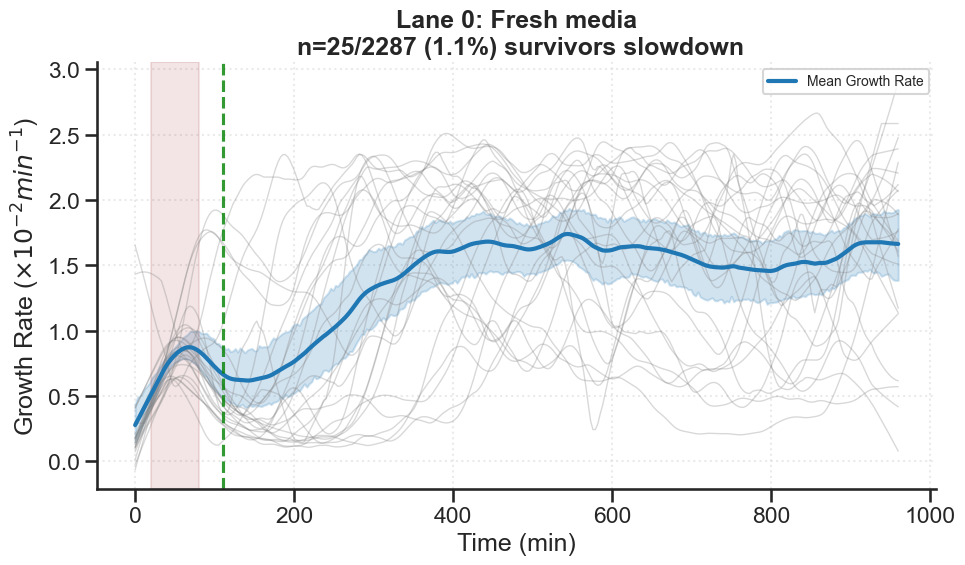

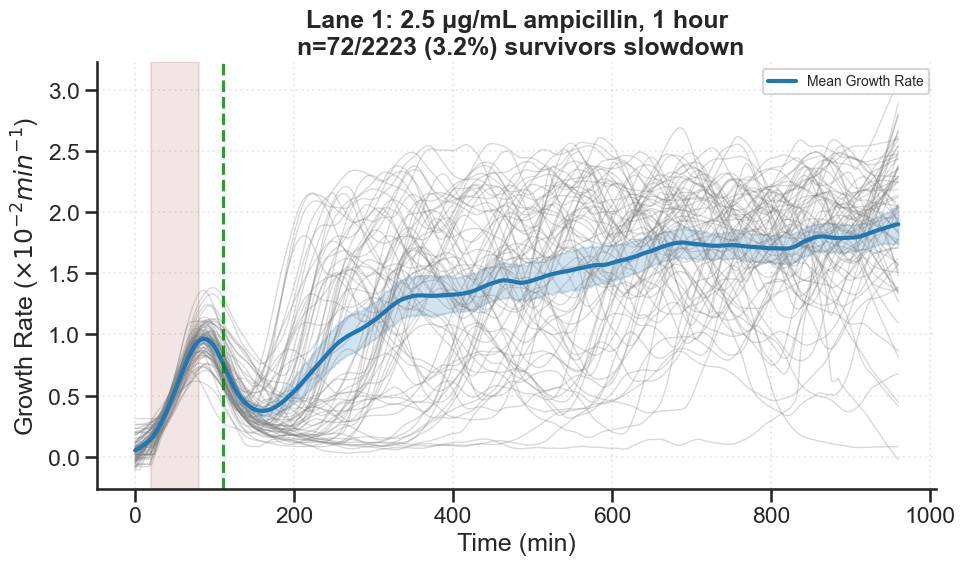

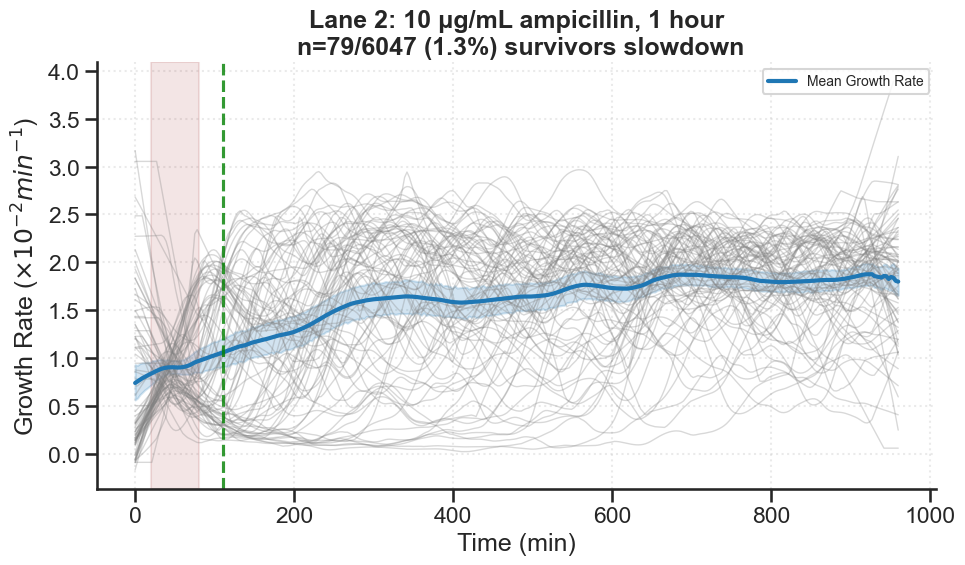

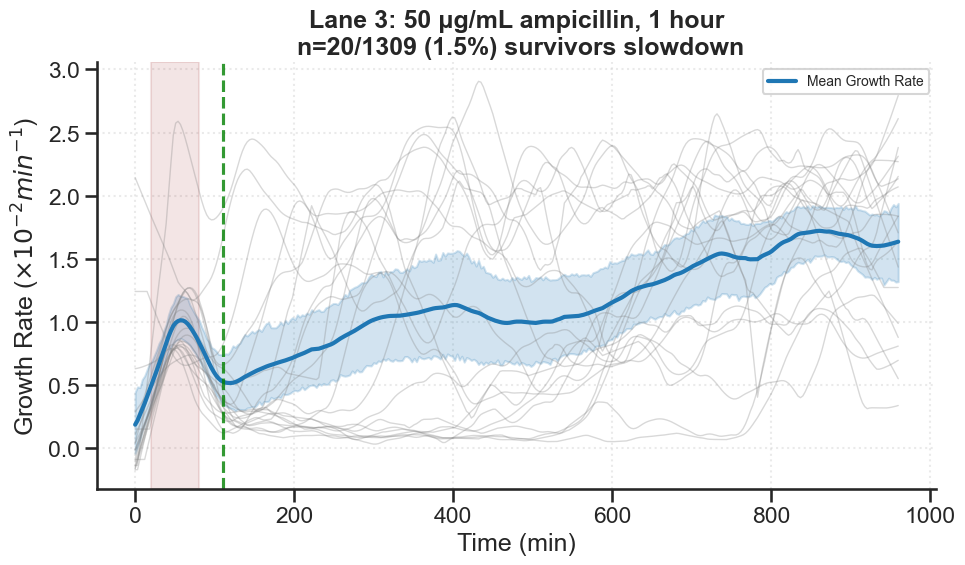

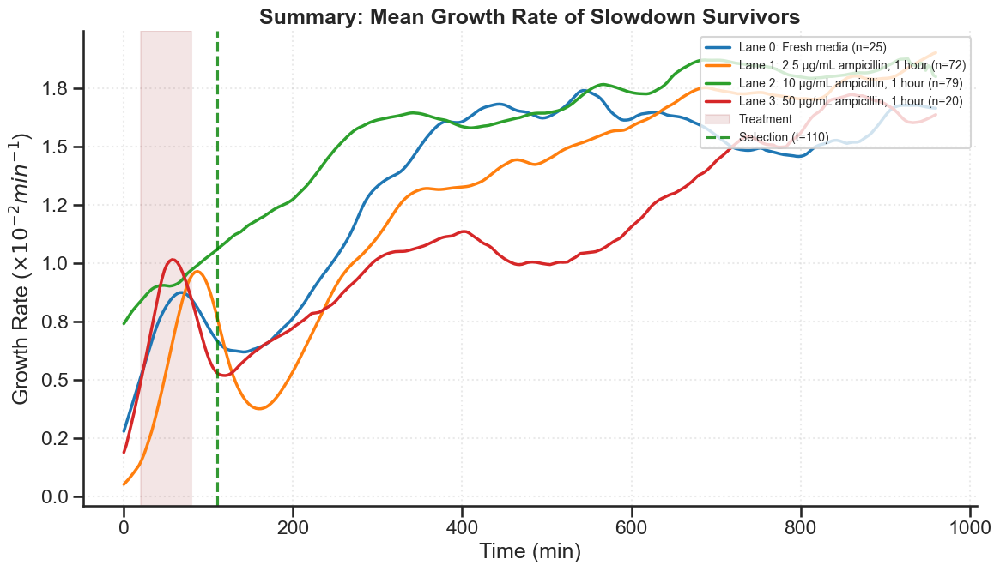

In [46]:
# Plot growth rates of surviving cells that slowdown at t=X minutes after treatment start
check_time = 20 + 90 # minutes

plot_slowdown_survivor_growth_rates(
    locals().get('mother_machine_data'), 
    check_time=check_time, 
    treatment_start=locals().get('treatment_start'), 
    treatment_end=locals().get('treatment_end')
)

In [48]:
# Create PDF with single-cell traces of these slowdown survivors
generate_slowdown_survivor_pdf(
    df=locals().get('mother_machine_data'),
    slowdown_params=slowdown_params, # must be defined
    treatment_start=treatment_start,
    treatment_end=treatment_end,
    check_time=check_time
)

 GENERATING SLOWDOWN SURVIVOR PDF 
Found 196 Slowdown Survivors. Generating PDF...


Generating Pages:   0%|          | 0/196 [00:00<?, ?it/s]

PDF saved to: /mnt/ka_gh_storage/2025_11_27_40x_persister_1HourAmpicillinTreatments/slowdown_survivor_traces_t110_2025_11_27_40x_persister_1HourAmpicillinTreatments_20260111_160653.pdf


In [ ]:
# MODIFY CODE TO ADD (OPTIONAL) CELL LENGTH LIMIT DURING FIRST FEW HOURS (STATIONARY)
# ALSO SET GROWTH RATE TO 0 DURING STATIONARY

In [ ]:
# check for slowdown at 150 minutes post treatment; look at % slowdown cells, look at magnitude of slowdown so far (current) and total (total), also look at start time of that slowdown event

In [5]:
# classification
# manual napari check, then plots?

In [ ]:
# re-run at_end for at_end True with growth_rate (actualy, growing_after?)
# possibly add buffer after lysis timepoint for LOWESS?
# run smoothing parameter test for all timepoints

In [ ]:
# identify different classes automatically based on parameters (can adjust these parameters later to match manual classificaition)
# then run manual review -- napari for persister classes, also checking growth slowdown plots etc
# then plotting code

In [ ]:
# NAPARI CHECK NOW OR LATER??

In [4]:
# Napari classification (video-based version) 

In [ ]:
# New version
# =============================================================================
# CELL 1: Setup and Bulk Load (Run this only ONCE per session)
# =============================================================================
# =============================================================================
# USER SETTINGS
# =============================================================================
include_lanes         = [1, 2, 3, 4]
PC_channel            = 0 # in trenches.zarr
play_interval_ms      = 10
MASK_TO_UINT8         = True
UPSCALE_XY            = (1, 2, 2)
GROWTH_SCALE          = (0.375, 0.375)
BOTTOM_MARGIN_WU      = 6.0
GROWTH_CACHE_MAX      = 256
CACHE_MB_TRENCHES     = 4096
CACHE_MB_MASKS        = 2048
MAX_T_FOR_REVIEW      = None

# Dask & blosc tuning...
dask.config.set({"array.slicing.split_large_chunks": True, "optimization.fuse.active": True, "scheduler": "threads"})
MAX_WORKERS = max(4, (os.cpu_count() or 8) - 2)
try:
    numcodecs.blosc.set_nthreads(MAX_WORKERS)
except Exception:
    pass

# Helper Functions (Part 1 - Data Loading & Processing)...
def _open_zarr_array(anything, cache_mb=512):
    if isinstance(anything, zarr.core.Array):
        store, path = anything.store, getattr(anything, "path", None)
    elif isinstance(anything, (str, Path)):
        p = str(anything)
        try:
            arr = zarr.open_array(p, mode="r")
            store, path = arr.store, getattr(arr, "path", None)
        except Exception:
            grp = zarr.open_group(p, mode="r")
            for _, v in grp.arrays():
                store, path = v.store, v.path
                break
            else: raise ValueError(f"No arrays found in Zarr group at {p}")
    else:
        store, path = anything.store, getattr(anything, "path", None)
    cached = LRUStoreCache(store, max_size=cache_mb * (1024**2))
    return zarr.open_array(store=cached, path=path, mode="r") if path else zarr.open_array(store=cached, mode="r")

def _to_c(arr): return np.ascontiguousarray(arr)

def _maybe_downcast_raw(raw_np):
    if raw_np.dtype == np.float32:
        lo, hi = np.percentile(raw_np, (0.1, 99.9))
        if hi > lo: return (np.clip((raw_np - lo) / (hi - lo), 0, 1) * 65535.0).astype(np.uint16)
    return raw_np

def _load_one(mid, trenches_da, masks_da, frames_to_load, pc_channel, mask_to_uint8):
    raw_da = trenches_da[mid, :frames_to_load, pc_channel, :, :]
    mask_da = masks_da[mid, :frames_to_load, 0, :, :]
    raw_np, mask_np = da.compute(raw_da, mask_da)
    raw_np = _to_c(_maybe_downcast_raw(raw_np))
    mask_np = _to_c(mask_np)
    if mask_to_uint8 and mask_np.dtype != np.uint8: mask_np = (mask_np != 0).astype(np.uint8, copy=False)
    return raw_np, mask_np

@lru_cache(maxsize=GROWTH_CACHE_MAX)
def growth_rgba_for(mid: int) -> np.ndarray:
    df = growing_filtered[growing_filtered['mother_id'] == mid]
    fig = plt.Figure(figsize=(8, 2), dpi=100)
    canvas = FigureCanvas(fig)
    ax = fig.add_subplot(111); ax.plot(df['time_average'].values, df['log_area'].values, linewidth=1); ax.axvspan(t1, t2, alpha=0.2, color='red')
    ax.set(xlabel='Time (min)', ylabel='log(area)', title=f"ID {mid}"); fig.tight_layout(pad=0.3); canvas.draw()
    buf = np.frombuffer(canvas.buffer_rgba(), dtype=np.uint8)
    h, w = canvas.get_width_height()[::-1]
    rgb = buf.reshape((h, w, 4))[..., :3]; plt.close(fig)
    return rgb

# Helper Functions (Part 2 - Napari Layout)...
def set_mask_scale_to_match_image(image_layer, mask_layer, raw_data, mask_data):
    fy_img, fx_img, sy_img, sx_img = raw_data.shape[-2], raw_data.shape[-1], image_layer.scale[1], image_layer.scale[2]
    fy_msk, fx_msk = mask_data.shape[-2], mask_data.shape[-1]
    sy_msk = (fy_img * sy_img) / max(fy_msk, 1); sx_msk = (fx_img * sx_img) / max(fx_msk, 1)
    mask_layer.scale = (1, sy_msk, sx_msk)

def place_growth_panel_bottom(image_layer, growth_layer, raw_data, growth_img):
    gh, gw = growth_img.shape[0], growth_img.shape[1]; fy_img, fx_img = raw_data.shape[-2], raw_data.shape[-1]
    sy_img, sx_img = image_layer.scale[1], image_layer.scale[2]; fy_world, fx_world = fy_img * sy_img, fx_img * sx_img
    gh_world, gw_world = gh * GROWTH_SCALE[0], gw * GROWTH_SCALE[1]; ty = fy_world - gh_world - BOTTOM_MARGIN_WU
    tx = (fx_world - gw_world) * 0.5; growth_layer.scale = GROWTH_SCALE; growth_layer.translate = (ty, tx)
    
# Data Initialization...
trenches_cached = _open_zarr_array(trenches, cache_mb=CACHE_MB_TRENCHES); masks_cached = _open_zarr_array(masks, cache_mb=CACHE_MB_MASKS)
trenches_da = da.from_zarr(trenches_cached); masks_da = da.from_zarr(masks_cached)
try: frames_to_load = int(mother_machine_data["timepoint"].max())
except Exception: frames_to_load = int(trenches_da.shape[1])
frames_to_load = int(min(frames_to_load, trenches_da.shape[1]))
if MAX_T_FOR_REVIEW is not None: frames_to_load = min(frames_to_load, int(MAX_T_FOR_REVIEW))
growing_filtered = growing[growing['lane'].isin(include_lanes)]
all_ids = sorted(growing_filtered['mother_id'].unique())
try: discard_mother_IDs
except NameError: discard_mother_IDs = []
try: starv_induced_mother_IDs
except NameError: starv_induced_mother_IDs = []
try: abx_induced_mother_IDs
except NameError: abx_induced_mother_IDs = []

# =============================================================================
# Main Bulk Pre-loading Logic
# =============================================================================
data_cache = {}
# For the bulk loader, we can just use all_ids. The viewer will filter this later.
initial_ids_to_load = [m for m in all_ids if m not in (set(discard_mother_IDs) | set(starv_induced_mother_IDs) | set(abx_induced_mother_IDs))]

if not initial_ids_to_load:
    print("No mother_ids to load or classify.")
else:
    print(f"Starting bulk pre-load of {len(initial_ids_to_load)} cells into RAM...")
    with ThreadPoolExecutor(max_workers=MAX_WORKERS) as executor:
        # 1. Submit all tasks and keep track of all futures
        future_to_mid = {executor.submit(_load_one, mid, trenches_da, masks_da, frames_to_load, PC_channel, MASK_TO_UINT8): mid for mid in initial_ids_to_load}
        growth_futures = {executor.submit(growth_rgba_for, mid) for mid in initial_ids_to_load}
        
        # Combine all futures to track total progress
        all_futures = list(future_to_mid.keys()) + list(growth_futures)
        
        # 2. Iterate over all futures as they complete
        pbar_desc = f"Loading {len(initial_ids_to_load)} cells & plots"
        for future in tqdm(as_completed(all_futures), total=len(all_futures), desc=pbar_desc):
            # 3. Check if the completed future is a data-loading task
            if future in future_to_mid:
                mid = future_to_mid[future]
                try:
                    # If so, get the result and store it in the cache
                    data_cache[mid] = future.result()
                except Exception as exc:
                    print(f"ID {mid} failed to load: {exc}")

    print("Pre-loading complete. You can now run the cell below to start classifying.")

In [ ]:
# ==============================================================================
# CELL 2: Launch Napari (Run this cell anytime you want to classify, should resume from where you left off)
# ==============================================================================

# Global state that persists across viewer sessions
index = 0
raw_buf = mask_buf = growth_buf = None
_contrast_locked = False

def run_napari_classification():
    """Starts a new Napari viewer session using the pre-loaded data."""
    global index, raw_buf, mask_buf, growth_buf, _contrast_locked

    # ---vvv--- THIS LOGIC WAS MOVED FROM CELL 1 ---vvv---
    # Recalculate remaining IDs every time the viewer is launched
    processed = set(discard_mother_IDs) | set(starv_induced_mother_IDs) | set(abx_induced_mother_IDs)
    remaining_mother_ids = [m for m in all_ids if m not in processed]
    # ---^^^--- THIS LOGIC WAS MOVED FROM CELL 1 ---^^^---

    if not remaining_mother_ids:
        print("? All cells have been classified!")
        return
        
    viewer = napari.Viewer()
    
    # Reset layer state for the new viewer instance
    image_layer = mask_layer = growth_layer = None
    raw_buf = mask_buf = growth_buf = None
    _contrast_locked = False 
    
    # Reset index to start at the beginning of the *new* remaining list
    index = 0

    # Create a new timer for this specific viewer instance
    timer = QTimer()
    timer.setInterval(play_interval_ms)

    def play_time():
        if image_layer is None: return
        viewer.dims.set_current_step(0, (viewer.dims.current_step[0] + 1) % image_layer.data.shape[0])

    timer.timeout.connect(play_time)
    
    # --- Nested functions for layer management ---
    def _ensure_buffers(raw_data, mask_data, growth_img):
        nonlocal image_layer, mask_layer, growth_layer
        global raw_buf, mask_buf, growth_buf, _contrast_locked
        if raw_buf is None:
            raw_buf, mask_buf, growth_buf = (np.empty_like(d) for d in (raw_data, mask_data, growth_img))
            np.copyto(raw_buf, raw_data); np.copyto(mask_buf, mask_data); np.copyto(growth_buf, growth_img)
            image_layer = viewer.add_image(raw_buf, name="FOV", interpolation='nearest', scale=UPSCALE_XY)
            try: image_layer.interpolation2d = 'nearest'
            except: pass
            if not _contrast_locked:
                try:
                    clo, chi = np.percentile(raw_data, (0.5, 99.5))
                    image_layer.contrast_limits, image_layer.contrast_limits_range = (float(clo), float(chi)), (0.0, float(max(chi * 2, 65535 if raw_data.dtype == np.uint16 else 255)))
                    _contrast_locked = True
                except Exception as e: print(f"Could not set contrast limits: {e}")
            mask_layer = viewer.add_labels(mask_buf, name="Mask", visible=False, opacity=0.5)
            set_mask_scale_to_match_image(image_layer, mask_layer, raw_buf, mask_buf) 
            growth_layer = viewer.add_image(growth_buf, name="Growth", rgb=True, blending='translucent')
            place_growth_panel_bottom(image_layer, growth_layer, raw_buf, growth_buf)
        else:
            np.copyto(raw_buf, raw_data); np.copyto(mask_buf, mask_data); np.copyto(growth_buf, growth_img)
            image_layer.refresh(); mask_layer.refresh(); growth_layer.refresh()

    def load_mother_id(idx):
        if idx >= len(remaining_mother_ids): return
        was_active = timer.isActive();
        if was_active: timer.stop()
        mid = remaining_mother_ids[idx]
        print(f"\nDisplaying mother_id {mid} ({idx + 1}/{len(remaining_mother_ids)})")
        raw_data, mask_data = data_cache[mid]
        growth_img = growth_rgba_for(mid)
        with viewer.layers.events.blocker(), viewer.dims.events.current_step.blocker():
            _ensure_buffers(raw_data, mask_data, growth_img)
            viewer.layers.selection.active = image_layer; viewer.dims.set_current_step(0, 0)
            viewer.title = f"({idx + 1}/{len(remaining_mother_ids)}) ID = {mid}"
        if was_active: timer.start()

    # --- Define Hotkeys as Nested Functions ---
    def advance():
        global index
        index += 1
        if index < len(remaining_mother_ids): load_mother_id(index)
        else: viewer.close()

    @viewer.bind_key('Space')
    def toggle_play(viewer):
        if timer.isActive(): timer.stop(); print("Playback paused")
        else: timer.start(); print("Playback resumed")
    @viewer.bind_key('d')
    def mark_discard(viewer):
        mid = remaining_mother_ids[index]
        if mid not in discard_mother_IDs: discard_mother_IDs.append(mid)
        print(f"Discarded: {mid}"); advance()
    @viewer.bind_key('l')
    def mark_starvation(viewer):
        mid = remaining_mother_ids[index]
        if mid not in starv_induced_mother_IDs: starv_induced_mother_IDs.append(mid)
        print(f"Starvation-induced: {mid}"); advance()
    @viewer.bind_key('p')
    def mark_abx(viewer):
        mid = remaining_mother_ids[index]
        if mid not in abx_induced_mother_IDs: abx_induced_mother_IDs.append(mid)
        print(f"Antibiotic-induced: {mid}"); advance()

    # --- Initial Load, Autoplay, and Viewer Execution ---
    load_mother_id(index)
    timer.start()
    napari.run()
    
    # --- Cleanup after window closes ---
    timer.stop()
    if index < len(remaining_mother_ids):
        print(f"Napari viewer closed. Progress saved. {len(remaining_mother_ids) - index} cells remaining.")
    else:
        print("? Classification complete!")

# --- Execute the classifier ---
run_napari_classification()

In [ ]:
print(f"discard_mother_IDs = {discard_mother_IDs}")
print(f"starv_induced_mother_IDs = {starv_induced_mother_IDs}")
print(f"abx_induced_mother_IDs = {abx_induced_mother_IDs}")

In [ ]:
# Save lists manually to avoid having to re-run in future
discard_mother_IDs = [1, 2]
starv_induced_mother_IDs = [3]
abx_induced_mother_IDs = [4, 5]

In [ ]:
# ??

# Cell growth rate & slowdown classification

# Fluor data analysis

## Fluor data QC

### QC -- background fluorescence intensity

Plotting histograms for channels: ['GFP', 'mScarlet-I3', 'mVenus']


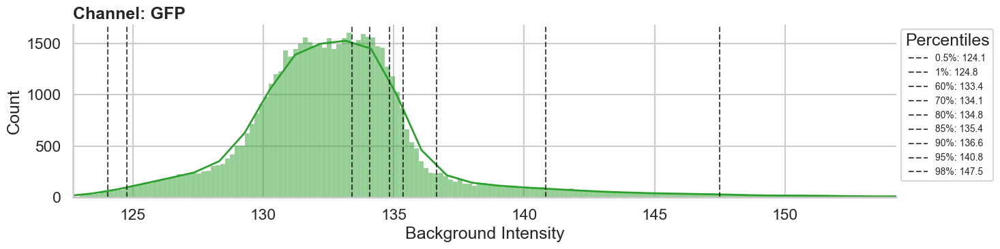

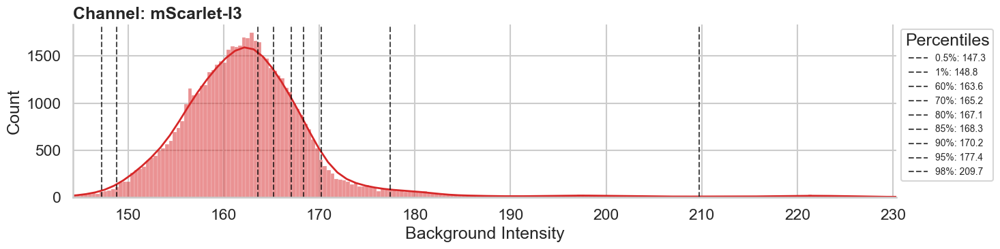

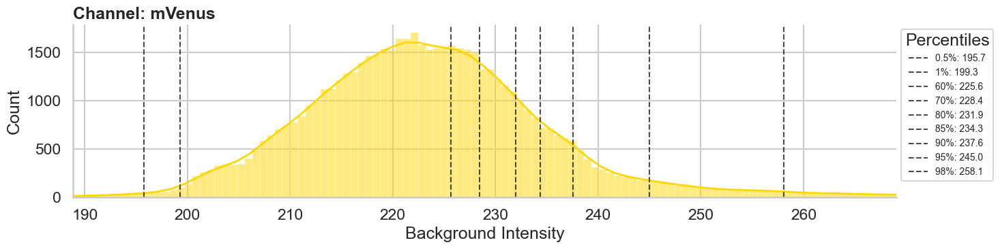

In [10]:
# Test which percentiles to use for background intensity threshold
PERCENTILES_TO_PLOT = [0.5, 1, 60, 70, 80, 85, 90, 95, 98]

plot_fluorescence_bg_histograms_custom(locals().get('mother_machine_data'), PERCENTILES_TO_PLOT)

Plotting GFP background histograms for 4 conditions...


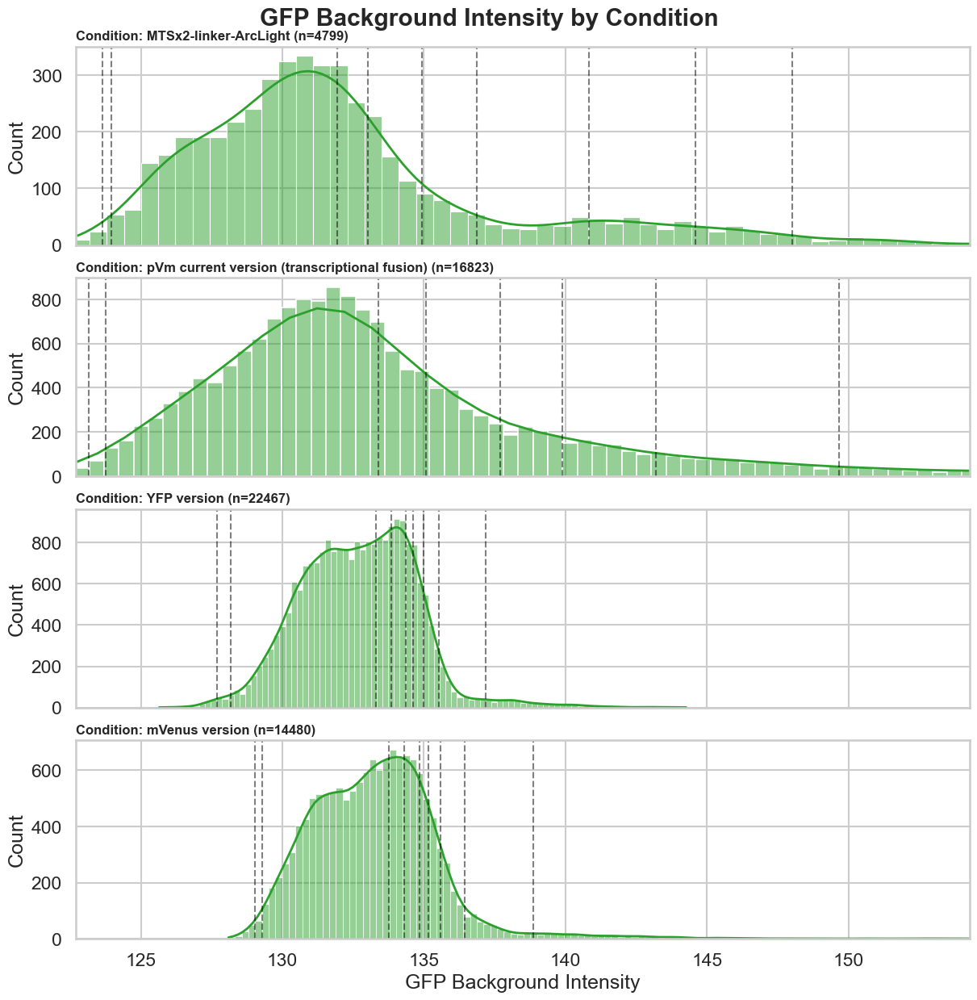

In [18]:
if 'plot_gfp_bg_histograms_by_condition' in locals():
    plot_gfp_bg_histograms_by_condition(locals().get('mother_machine_data'), PERCENTILES_TO_PLOT)

Filtering Criteria and Cutoffs (Growing Cells Only if available):
  GFP: Keeping range 6% (127.80) - 90% (136.65)
  mScarlet-I3: Keeping range 0.5% (147.26) - 90% (170.21)
  mVenus: Keeping range 0.5% (195.73) - 95% (244.99)


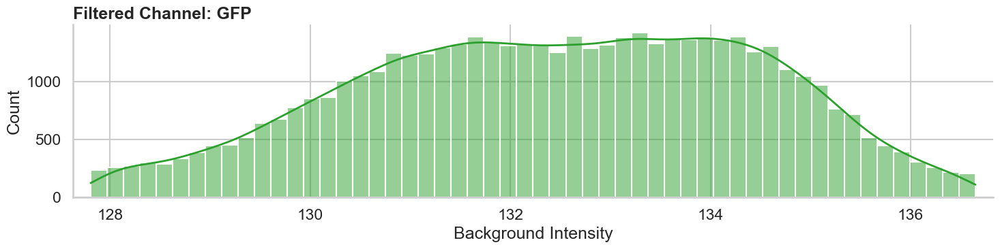

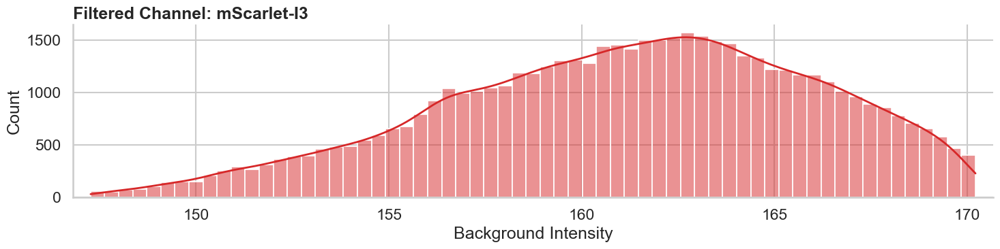

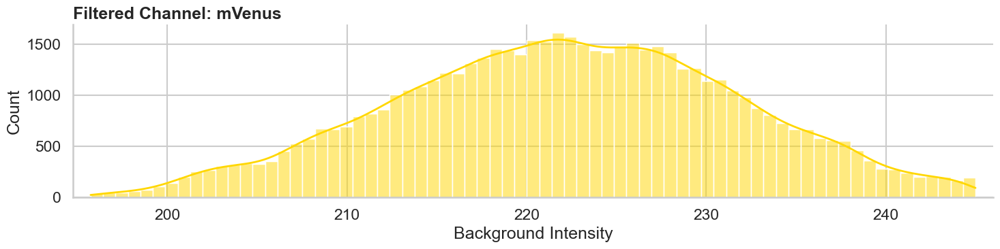

In [11]:
FLUOR_LIMITS = {
    'GFP': [6, 90],
    'mScarlet-I3': [0.5, 90],
    'mVenus': [0.5, 95]
}
    
plot_filtered_bg_histograms(locals().get('mother_machine_data'), FLUOR_LIMITS)

Calculating Cutoffs and Impact per Mother...
  GFP Limits: 6% (127.80) - 90% (136.65)
  mScarlet-I3 Limits: 0.5% (147.26) - 90% (170.21)
  mVenus Limits: 0.5% (195.73) - 95% (244.99)


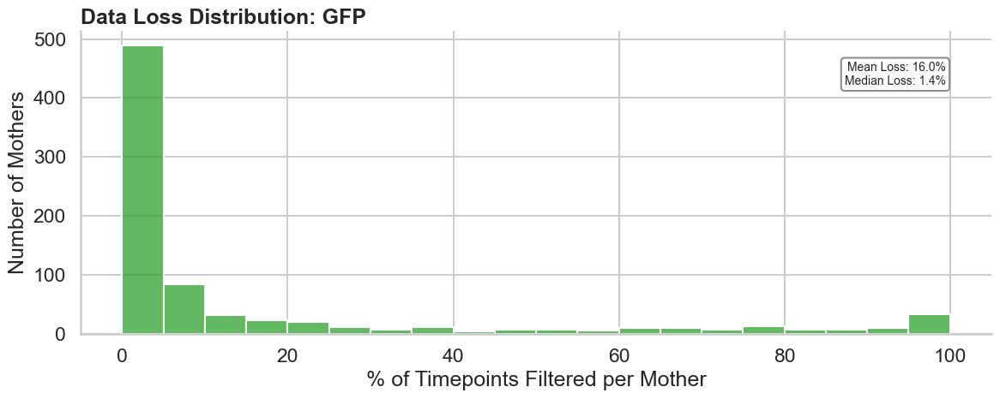

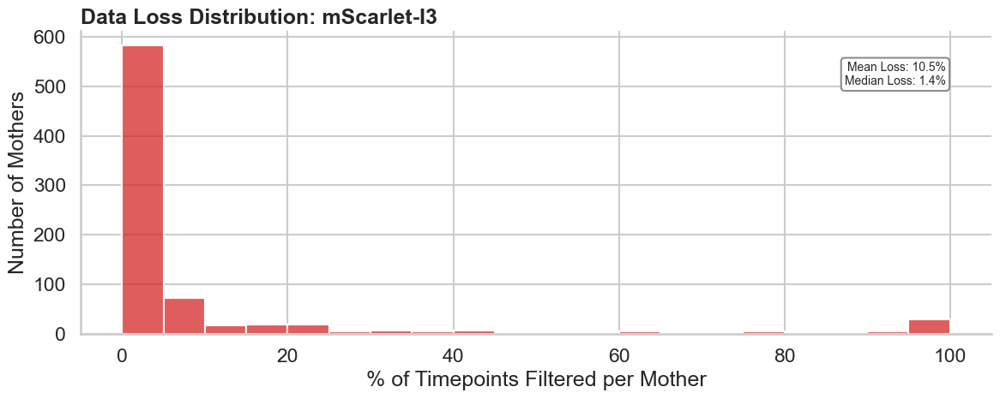

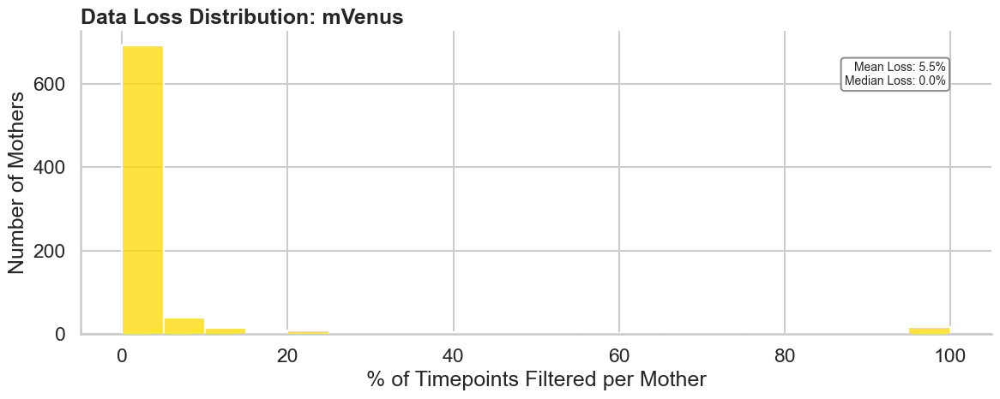

In [13]:
visualize_filtering_impact(locals().get('mother_machine_data'), FLUOR_LIMITS)

Identifying mothers with >20.0% data loss...
Found 343 channel-traces with high loss.


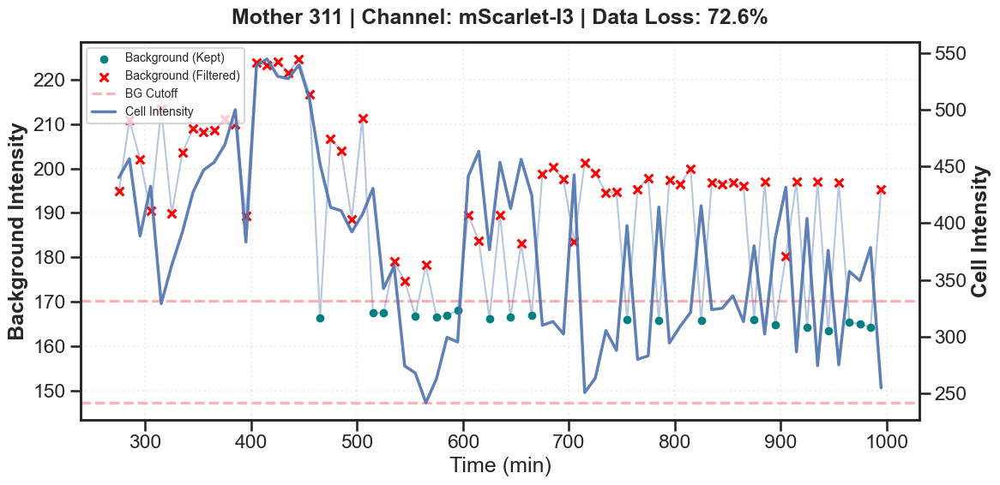

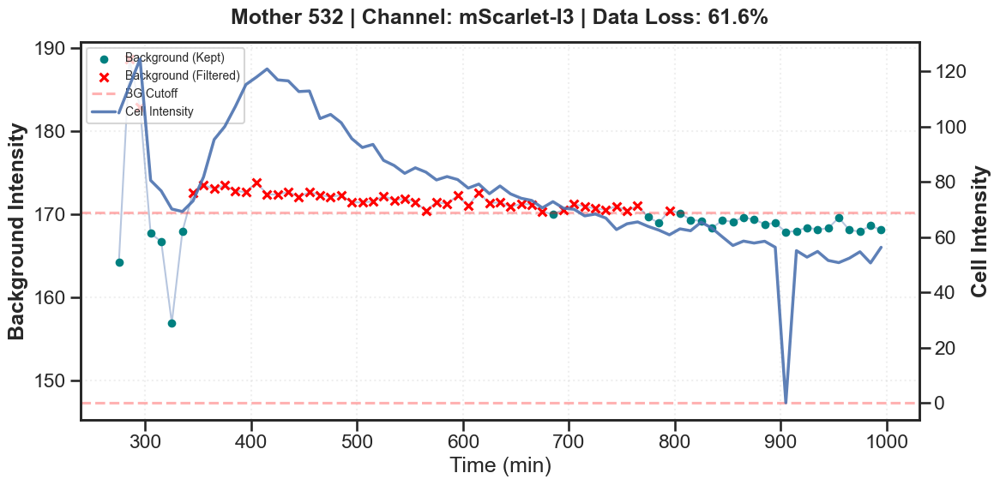

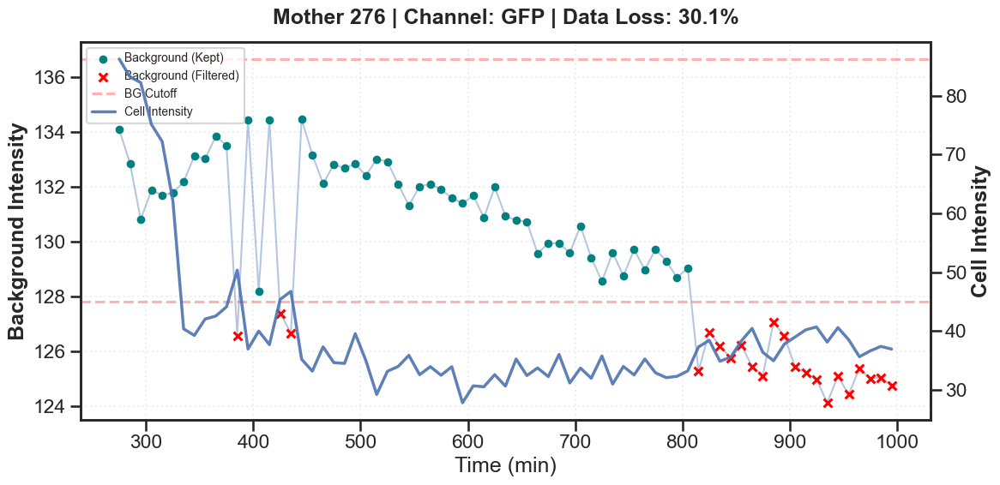

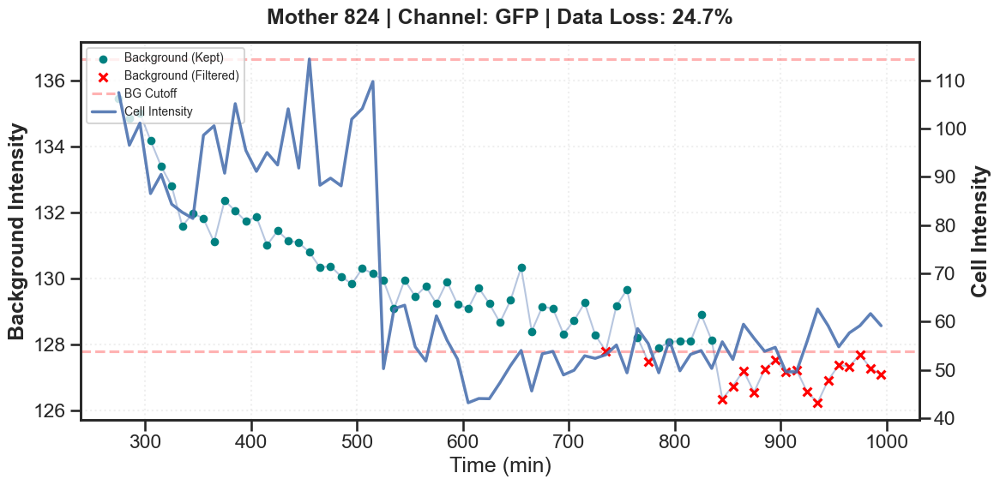

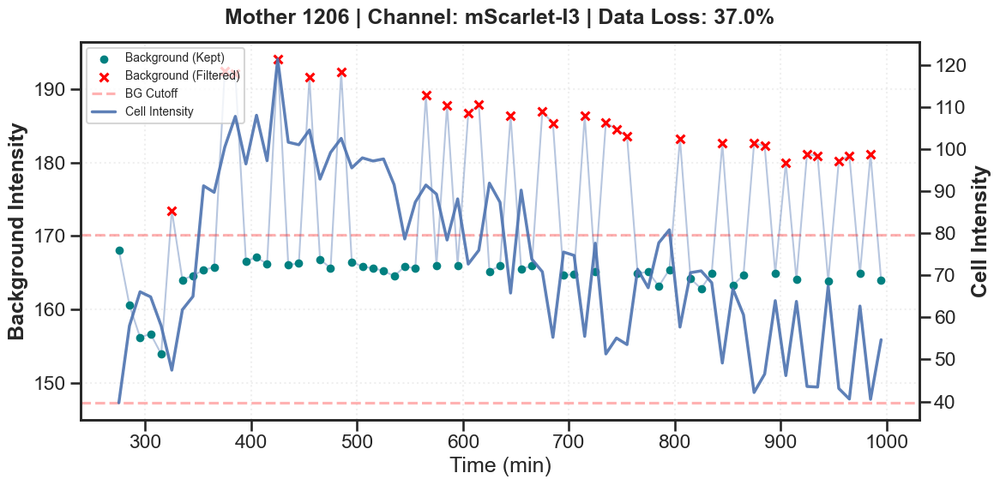

In [15]:
troubleshoot_high_loss_dual_plot(locals().get('mother_machine_data'), FLUOR_LIMITS, loss_threshold=20.0)

In [23]:
# most >threshold background seems just due to light being turned on etc, implement discard mother_id only if >X% are >threshold, i.e. due to debris or something in background region

In [19]:
LOSS_THRESHOLD = 50 # max % allowed above threshold, otherwise mother_id is discarded

_res = apply_fluorescence_qc(locals().get('mother_machine_data'), FLUOR_LIMITS, loss_threshold=LOSS_THRESHOLD)
if _res is not None: mother_machine_data = _res

Applying Background Intensity QC (Threshold: >= 50% filtered)...
  Channel GFP: Cutoffs 6% (127.80) - 90% (136.65)
    -> 113 mothers failed in GFP
  Channel mScarlet-I3: Cutoffs 0.5% (147.26) - 90% (170.21)
    -> 64 mothers failed in mScarlet-I3
  Channel mVenus: Cutoffs 0.5% (195.73) - 95% (244.99)
    -> 33 mothers failed in mVenus

QC Complete.
Total Growing Mothers: 805
Passed QC: 664
Discarded (High BG Noise): 141

Discarded Mothers by Condition:
condition
pVm current version (transcriptional fusion)    95
MTSx2-linker-ArcLight                           31
YFP version                                     10
mVenus version                                   5
Name: count, dtype: int64


### QC -- check for plasmid loss/unreasonably low fluorescence

Calculating mean intensity between 275-331 min.
Plotting distributions for: ['GFP', 'mScarlet-I3', 'mVenus']


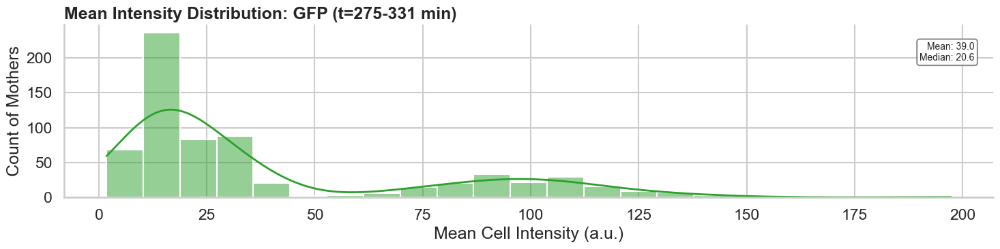

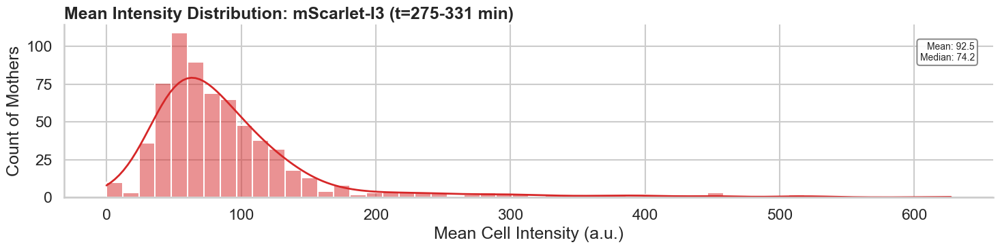

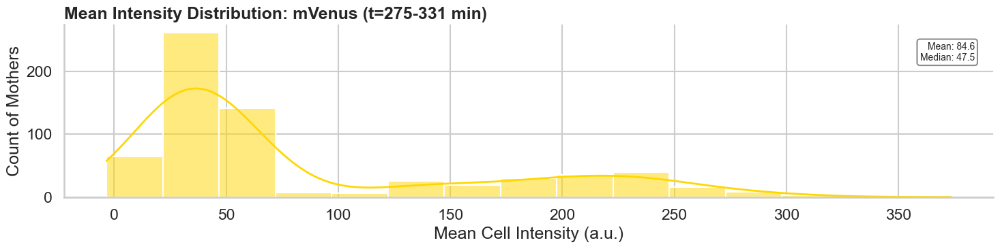

In [22]:
# -- CONFIGURATION: Time Range for Intensity QC --
QC_T1 = T1
QC_T2 = T2 # use growing range specified previously, or change manually as needed

plot_mean_intensity_histograms(locals().get('mother_machine_data'), QC_T1, QC_T2)

Plotting mean intensity (275-331 min) with 100 bins.


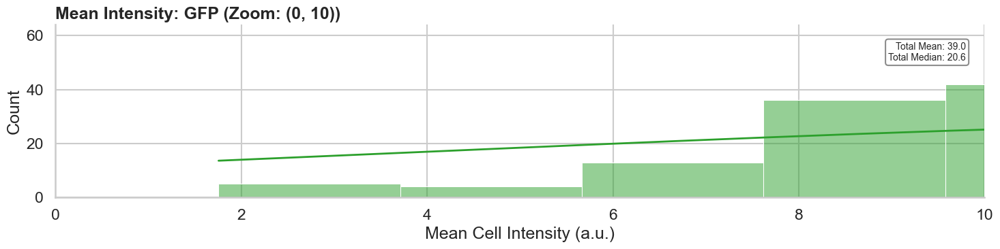

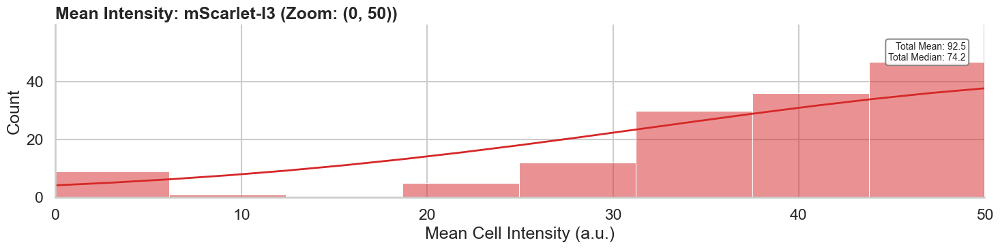

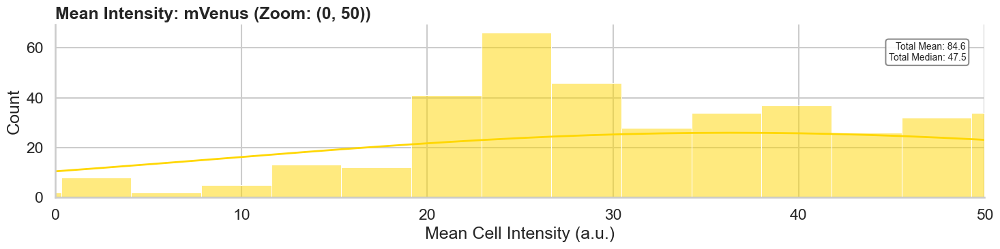

In [23]:
ZOOM_LIMITS = {
    'GFP': (0, 10),
    'mScarlet-I3': (0, 50),
    'mVenus': (0, 50)
}

plot_mean_intensity_histograms_zoomed_bins(locals().get('mother_machine_data'), QC_T1, QC_T2, ZOOM_LIMITS, n_bins=100)

In [24]:
FLUOR_THRESHOLDS = {
    'GFP': None,
    'mScarlet-I3': 15.0,
    'mVenus': None
}

_res = apply_intensity_qc(locals().get('mother_machine_data'), QC_T1, QC_T2, FLUOR_THRESHOLDS)
if _res is not None: mother_machine_data = _res

Applying Intensity QC (Time: 275-331 min)...
  Checking mScarlet-I3 >= 15.0...
    -> 10 mothers failed (mean < 15.0)

QC Complete.
Candidates (Passed BG QC): 664
Passed Intensity QC: 654
Discarded (Low Intensity): 10

Discarded Mothers by Condition:
condition
YFP version                                     5
mVenus version                                  3
MTSx2-linker-ArcLight                           1
pVm current version (transcriptional fusion)    1
Name: count, dtype: int64


In [75]:
mother_machine_data

,mother_id,timepoint,time,length,width,area,log_length,log_area,channel,intensity_raw,...,FOV_number,lane,condition,at_start,at_end,log_length_cleaned,division_event,growing_before,fluor_bg_QC,fluor_intensity_QC
0,0,0,275,11.821778,1.044076,9.208548,2.469943,2.220132,GFP,220.533760,...,0,0,MTSx2-linker-ArcLight,True,True,2.469943,False,False,False,False
1,0,0,275,11.821778,1.044076,9.208548,2.469943,2.220132,PC,10734.841507,...,0,0,MTSx2-linker-ArcLight,True,True,2.469943,False,False,False,False
2,0,0,275,11.821778,1.044076,9.208548,2.469943,2.220132,mScarlet-I3,224.133618,...,0,0,MTSx2-linker-ArcLight,True,True,2.469943,False,False,False,False
3,0,0,275,11.821778,1.044076,9.208548,2.469943,2.220132,mVenus,234.953802,...,0,0,MTSx2-linker-ArcLight,True,True,2.469943,False,False,False,False
4,0,1,285,4.991676,1.049679,3.972700,1.607772,1.379446,GFP,217.100494,...,0,0,MTSx2-linker-ArcLight,True,True,1.607772,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
480139,1834,71,985,2.160666,0.862598,1.420224,0.770416,0.350814,mVenus,296.377880,...,79,3,mVenus version,True,True,0.770416,False,False,False,False
480140,1834,72,995,1.636355,0.687392,0.870460,0.492471,-0.138734,GFP,147.578947,...,79,3,mVenus version,True,True,NaN,False,False,False,False
480141,1834,72,995,1.636355,0.687392,0.870460,0.492471,-0.138734,PC,10986.766917,...,79,3,mVenus version,True,True,NaN,False,False,False,False
480142,1834,72,995,1.636355,0.687392,0.870460,0.492471,-0.138734,mScarlet-I3,233.857143,...,79,3,mVenus version,True,True,NaN,False,False,False,False


In [76]:
mother_machine_data.to_pickle(mother_machine_data_pickle)

## Fluor plots

### Global means

Plotting population mean for 3 channels: ['GFP', 'mScarlet-I3', 'mVenus']


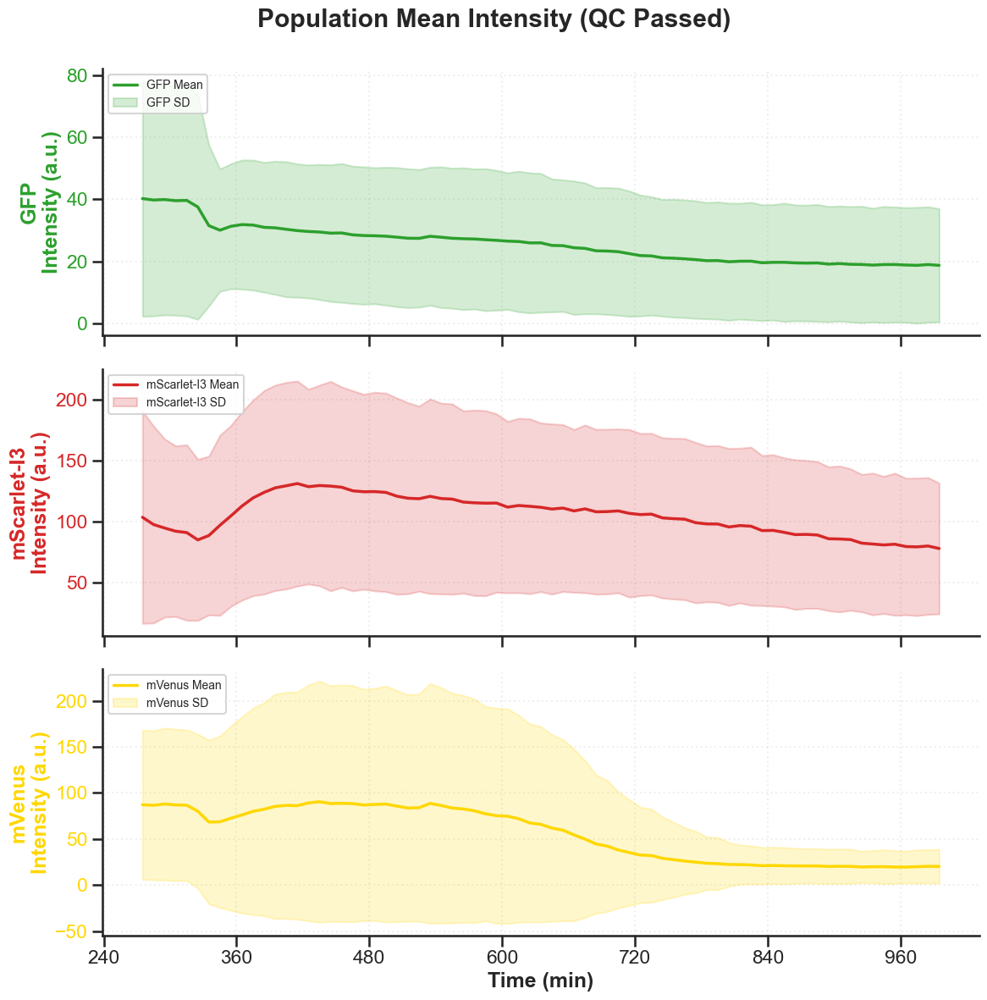

In [25]:
plot_population_mean_fluorescence(locals().get('mother_machine_data'))

### Different conditions means

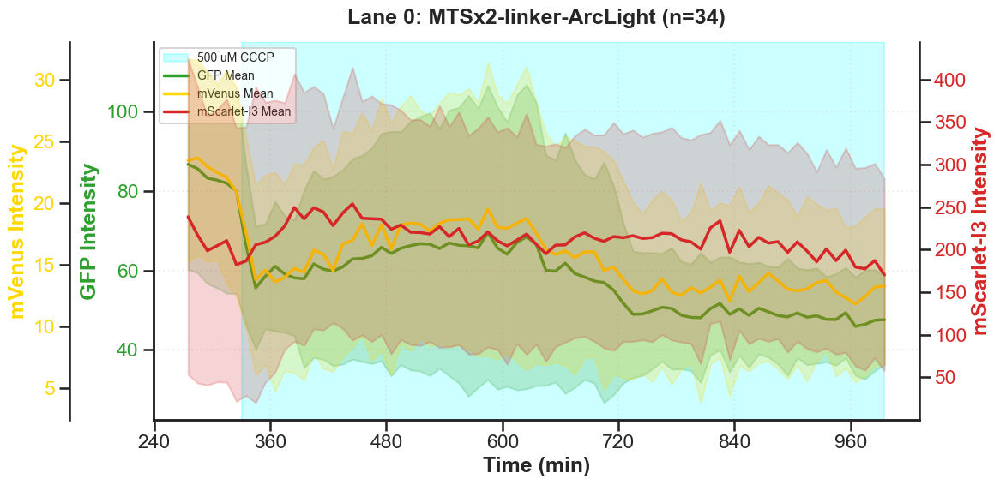

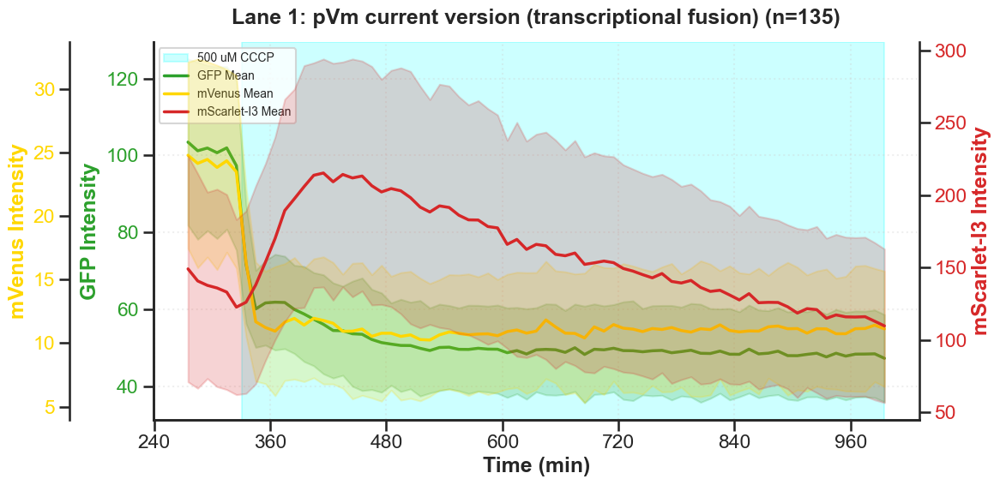

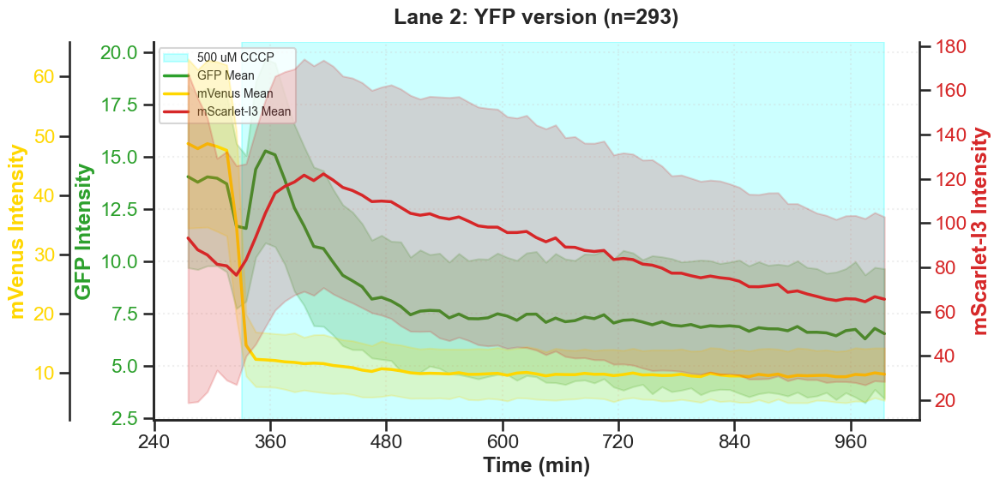

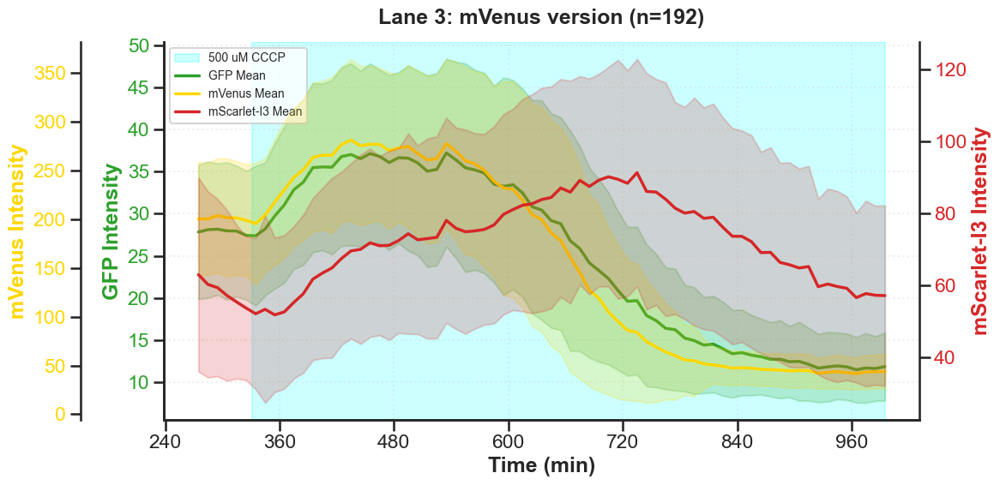

In [26]:
# -- CONFIGURATION: Add custom shaded regions --
# Use 'end': None to shade until the end of the data.
SHADING_REGIONS = [
    {
        'start': T2,    
        'end': None,      # None means "until the end"
        'color': 'cyan', 
        'alpha': 0.2, 
        'label': '500 uM CCCP'
    }
]

plot_population_mean_fluorescence_ordered_by_lane(locals().get('mother_machine_data'), SHADING_REGIONS)

### Ratio mean (filter mScarlet-I3 small values)

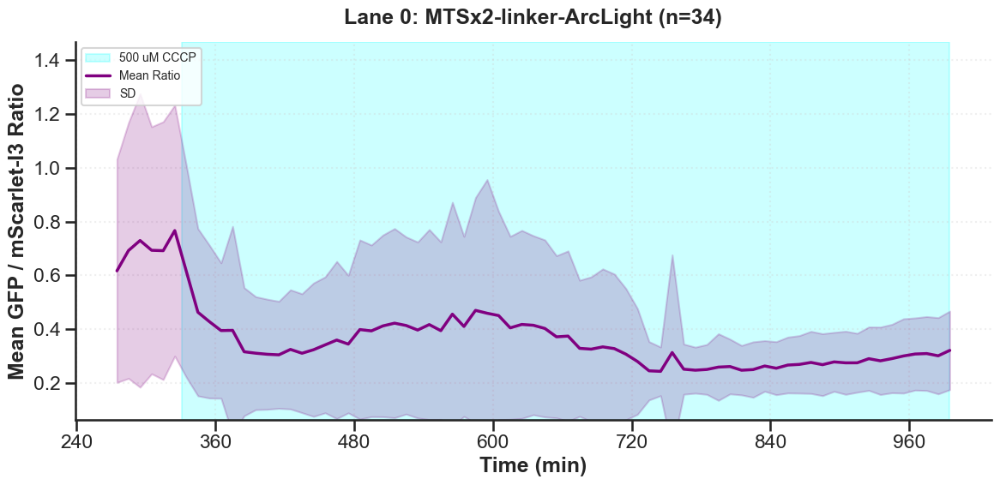

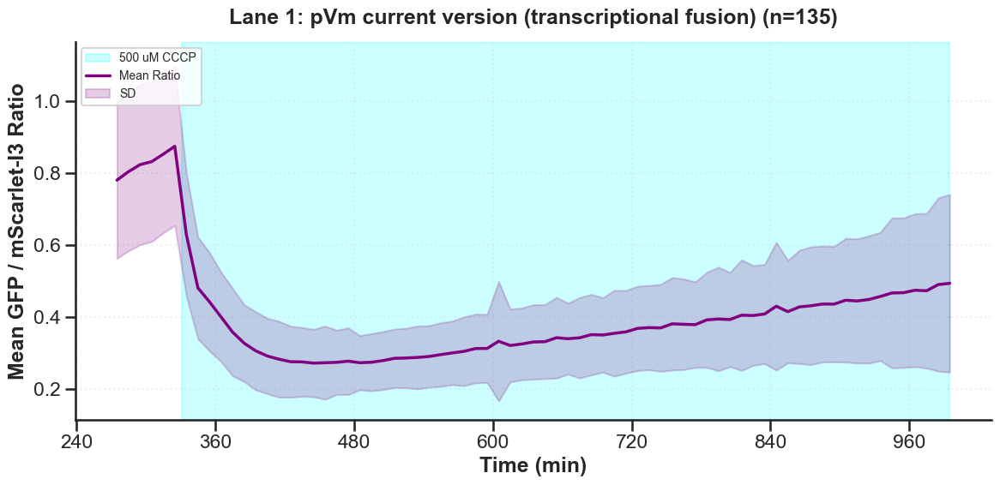

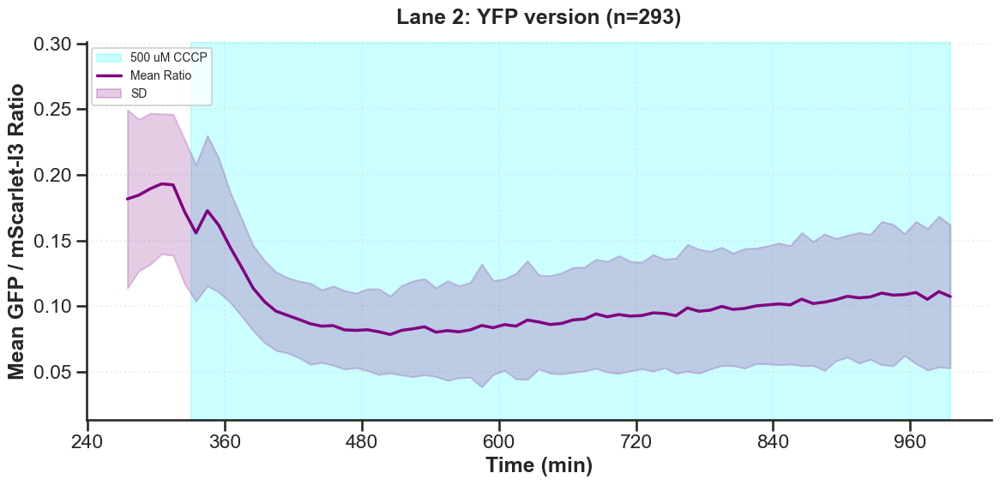

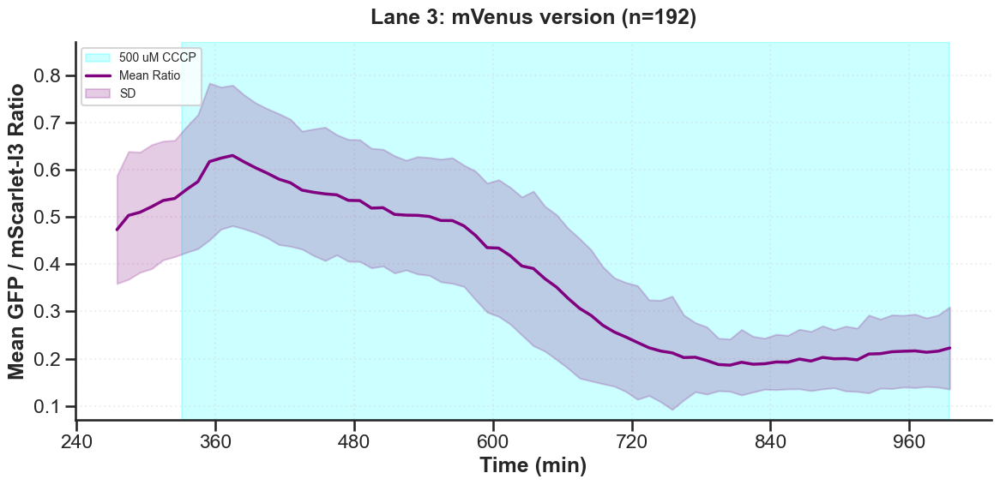

In [30]:
# -- CONFIGURATION: Ratio Definition --
RATIO_CONFIG_GFP = {
    'numerator': 'GFP',
    'denominator': 'mScarlet-I3',
    'label': 'Mean GFP / mScarlet-I3 Ratio',
    'min_denominator_threshold': 15  # Ignore timepoints below this value
}

# -- CONFIGURATION: Y-Axis Limits (Percentiles) --
Y_PERCENTILES = (1, 99)

plot_population_mean_ratio_ordered_by_lane(locals().get('mother_machine_data'), SHADING_REGIONS, RATIO_CONFIG_GFP, y_percentiles=Y_PERCENTILES)

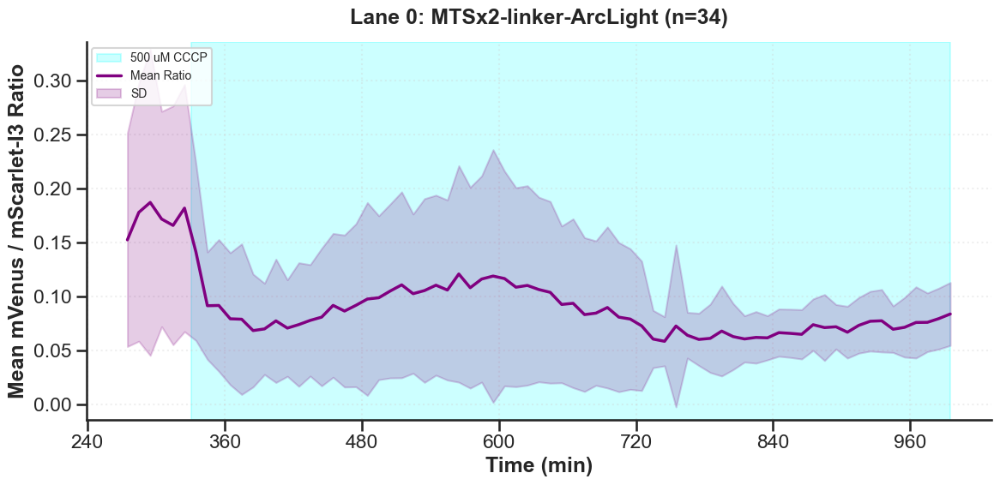

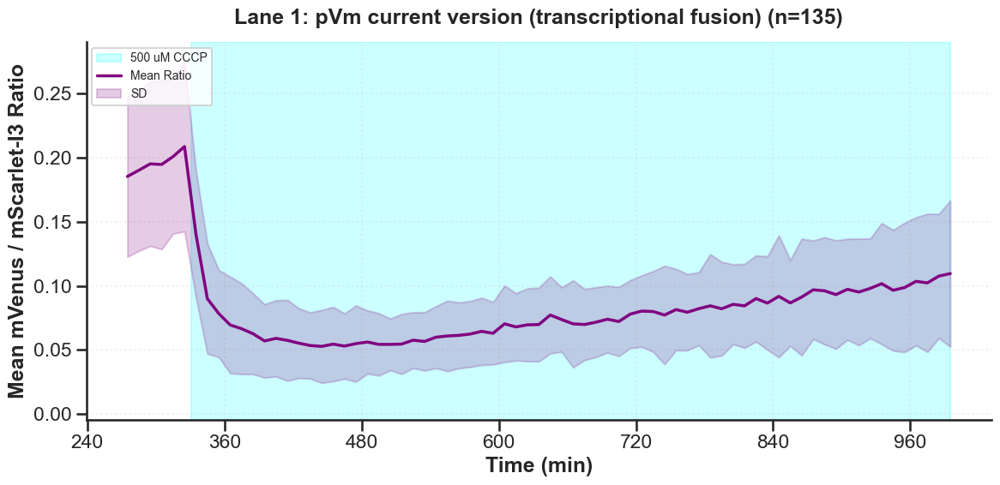

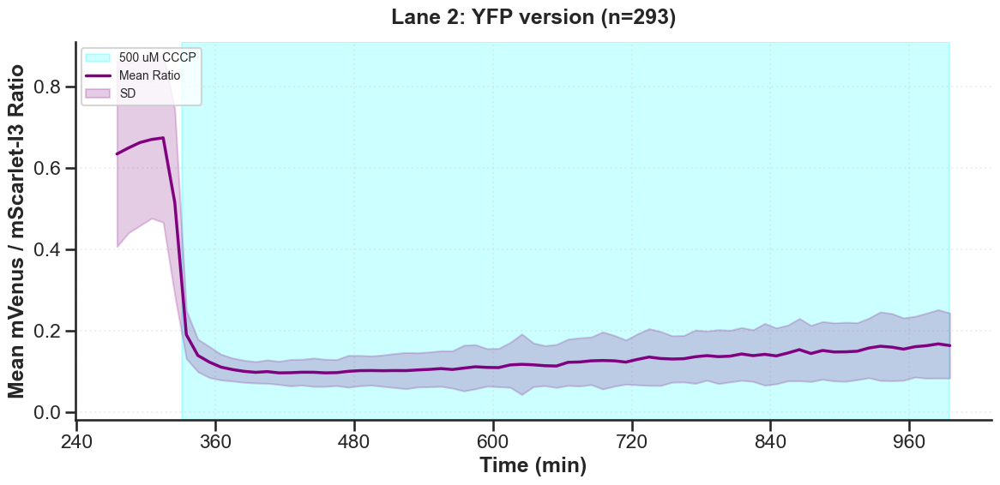

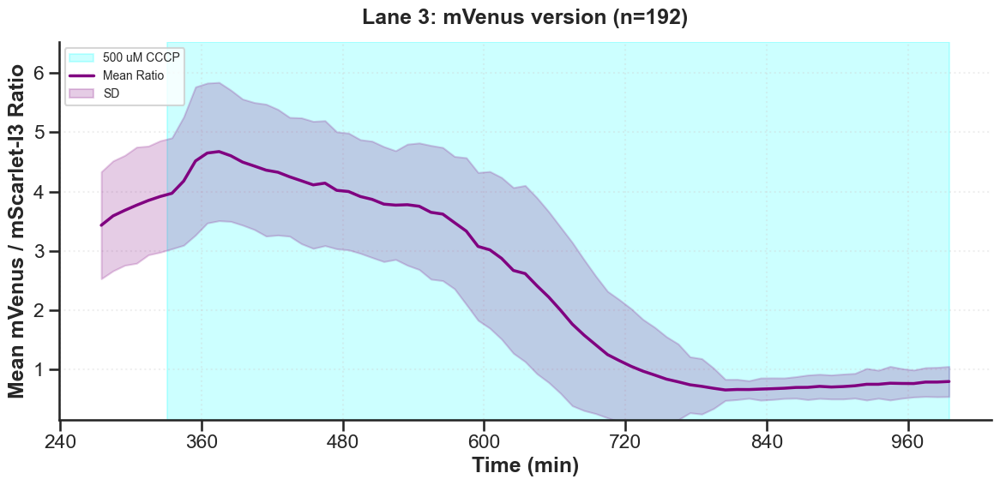

In [28]:
# -- CONFIGURATION: Ratio Definition --
RATIO_CONFIG_mVenus = {
    'numerator': 'mVenus',
    'denominator': 'mScarlet-I3',
    'label': 'Mean mVenus / mScarlet-I3 Ratio',
    'min_denominator_threshold': 15  # Ignore timepoints below this value
}

# -- CONFIGURATION: Y-Axis Limits (Percentiles) --
Y_PERCENTILES = (1, 99)

plot_population_mean_ratio_ordered_by_lane(locals().get('mother_machine_data'), SHADING_REGIONS, RATIO_CONFIG_mVenus, y_percentiles=Y_PERCENTILES)

In [35]:
# Dynamic range calculations:

In [31]:
# Define 2 regions to use for fold-change calculation
REGION_1 = (T1, T2)
REGION_2 = (810, 840)

summary_df, per_mother_values = summarize_regions_with_singlecell_sd_and_gfp(locals().get('mother_machine_data'), RATIO_CONFIG_GFP, region1=REGION_1, region2=REGION_2, min_points_per_region=1)

print("GFP/mScarlet-I3")
print_copy_pastable_summary_piped_aligned(summary_df) # Clean copy-pastable lines

clean_table = make_copy_pastable_summary_df(summary_df) # Clean table
clean_table

# summary_df # Full summary dataframe

GFP/mScarlet-I3
Lane 0 | MTSx2-linker-ArcLight                        | Vm-sensitive dynamic range: 40.7 ± 43.5% | Exponential phase mean GFP: 85.7 
Lane 1 | pVm current version (transcriptional fusion) | Vm-sensitive dynamic range: 45.8 ± 36.3% | Exponential phase mean GFP: 101.1
Lane 2 | YFP version                                  | Vm-sensitive dynamic range: 41.2 ± 33.9% | Exponential phase mean GFP: 13.7 
Lane 3 | mVenus version                               | Vm-sensitive dynamic range: 60.9 ± 15.0% | Exponential phase mean GFP: 27.8 


,Lane,Condition,Vm-sensitive dynamic range (%),Exp phase mean GFP,n
0,0,MTSx2-linker-ArcLight,40.7 ± 43.5,85.7,32
1,1,pVm current version (transcriptional fusion),45.8 ± 36.3,101.1,134
2,2,YFP version,41.2 ± 33.9,13.7,283
3,3,mVenus version,60.9 ± 15.0,27.8,189


In [32]:
# Define 2 regions to use for fold-change calculation
REGION_1 = (T1, T2)
REGION_2 = (810, 840)

summary_df, per_mother_values = summarize_regions_with_singlecell_sd_and_gfp(locals().get('mother_machine_data'), RATIO_CONFIG_mVenus, region1=REGION_1, region2=REGION_2, min_points_per_region=1)

print("mVenus/mScarlet-I3")
print_copy_pastable_summary_piped_aligned(summary_df) # Clean copy-pastable lines

clean_table = make_copy_pastable_summary_df(summary_df) # Clean table
clean_table

# summary_df # Full summary dataframe

mVenus/mScarlet-I3
Lane 0 | MTSx2-linker-ArcLight                        | Vm-sensitive dynamic range: 56.1 ± 65.1% | Exponential phase mean GFP: 23.4 
Lane 1 | pVm current version (transcriptional fusion) | Vm-sensitive dynamic range: 50.4 ± 28.3% | Exponential phase mean GFP: 24.2 
Lane 2 | YFP version                                  | Vm-sensitive dynamic range: 75.7 ± 13.3% | Exponential phase mean GFP: 46.3 
Lane 3 | mVenus version                               | Vm-sensitive dynamic range: 80.9 ± 6.9%  | Exponential phase mean GFP: 200.7


,Lane,Condition,Vm-sensitive dynamic range (%),Exp phase mean GFP,n
0,0,MTSx2-linker-ArcLight,56.1 ± 65.1,23.4,32
1,1,pVm current version (transcriptional fusion),50.4 ± 28.3,24.2,134
2,2,YFP version,75.7 ± 13.3,46.3,283
3,3,mVenus version,80.9 ± 6.9,200.7,189


### Single-cell traces

GFP/mScarlet-I3


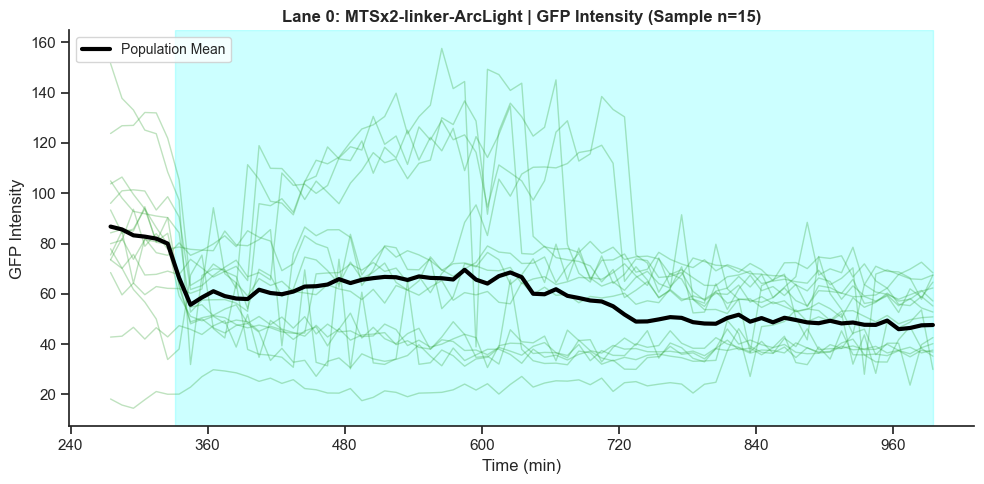

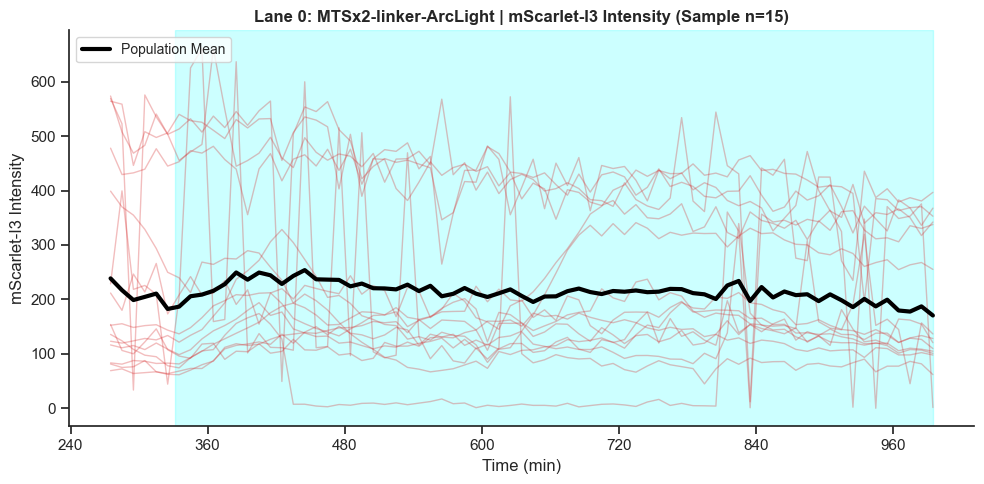

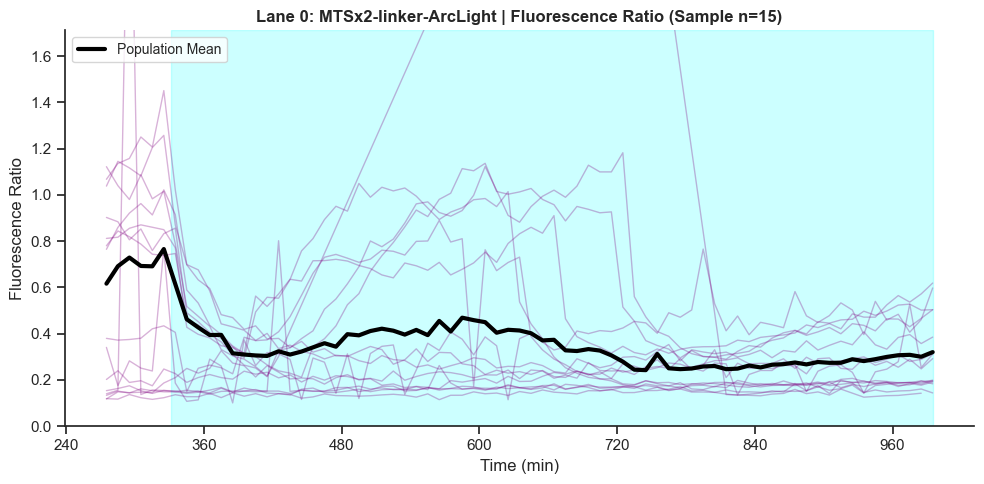

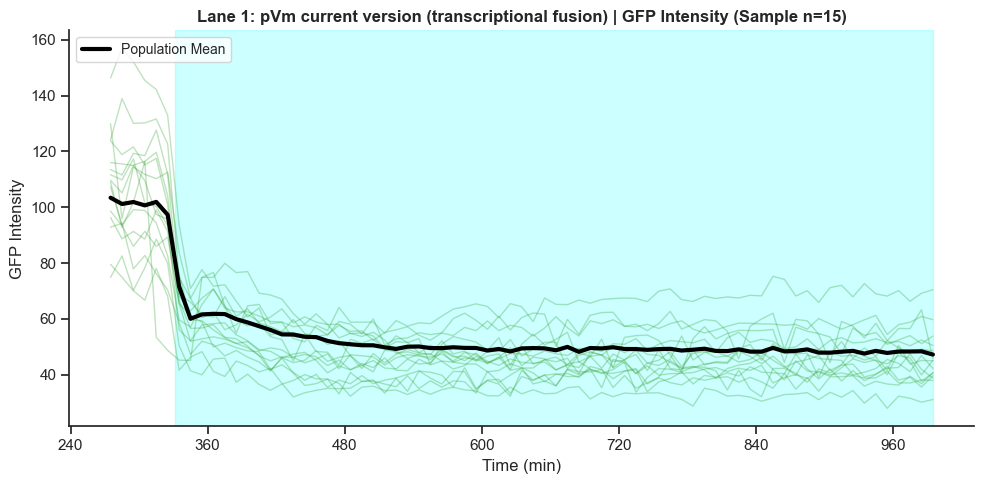

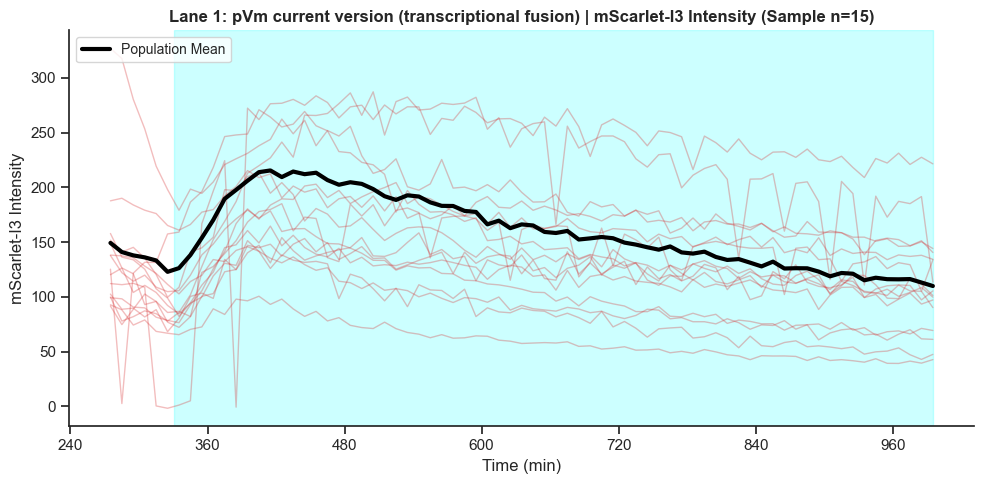

...

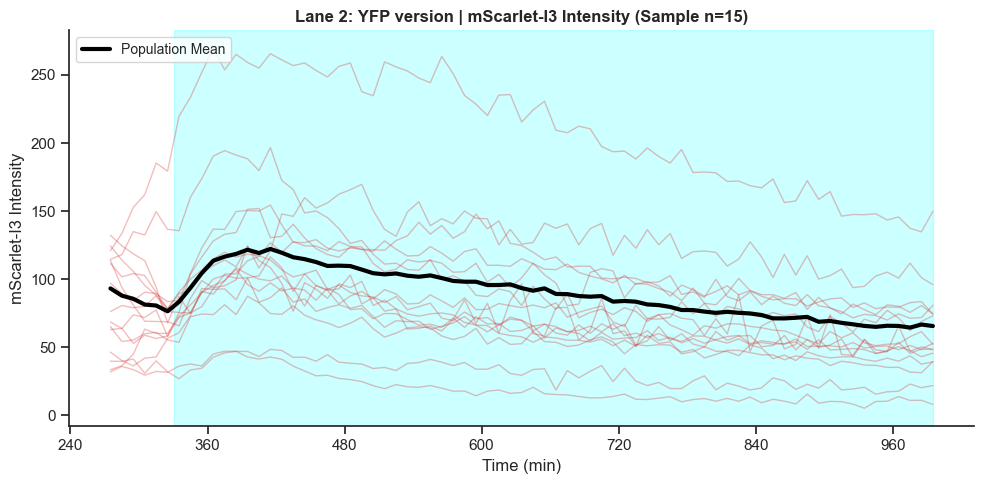

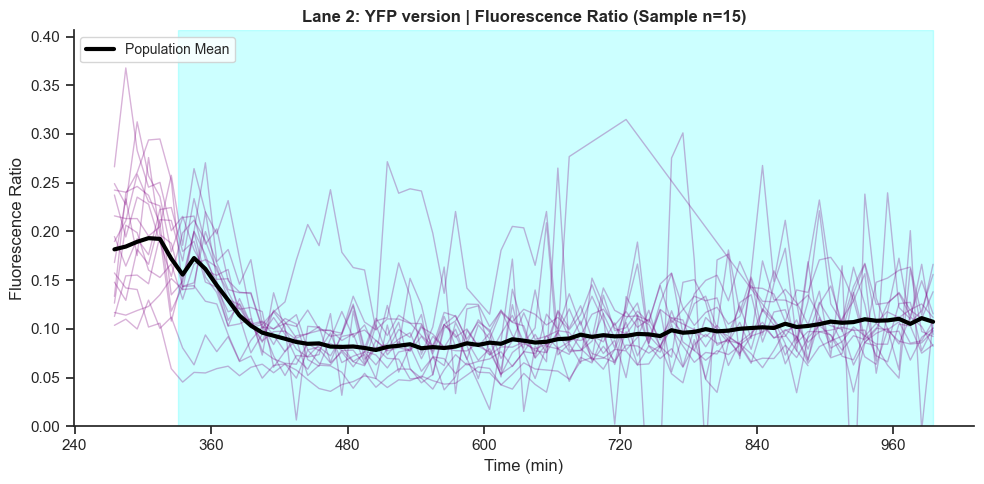

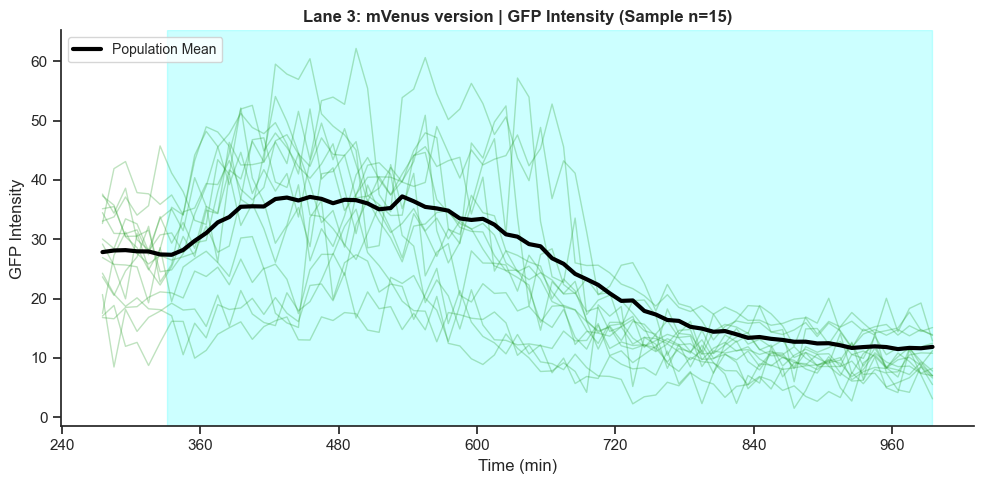

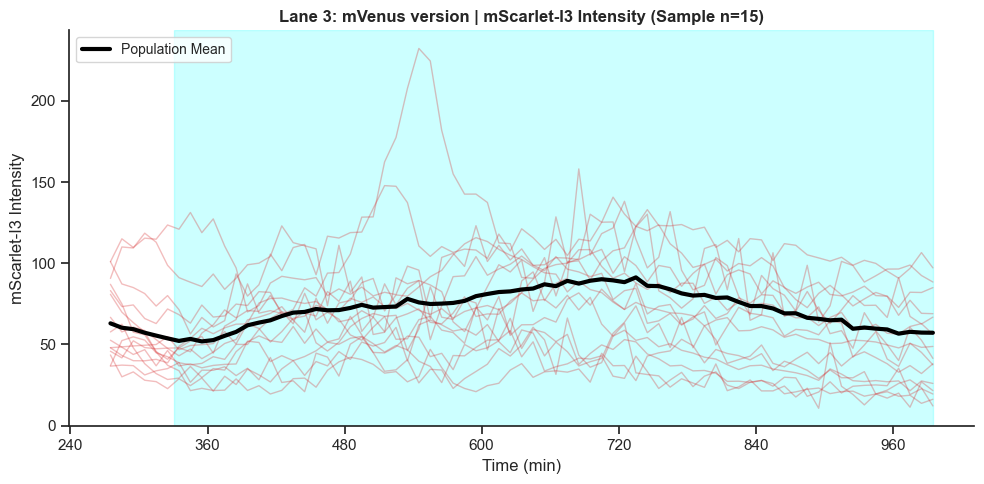

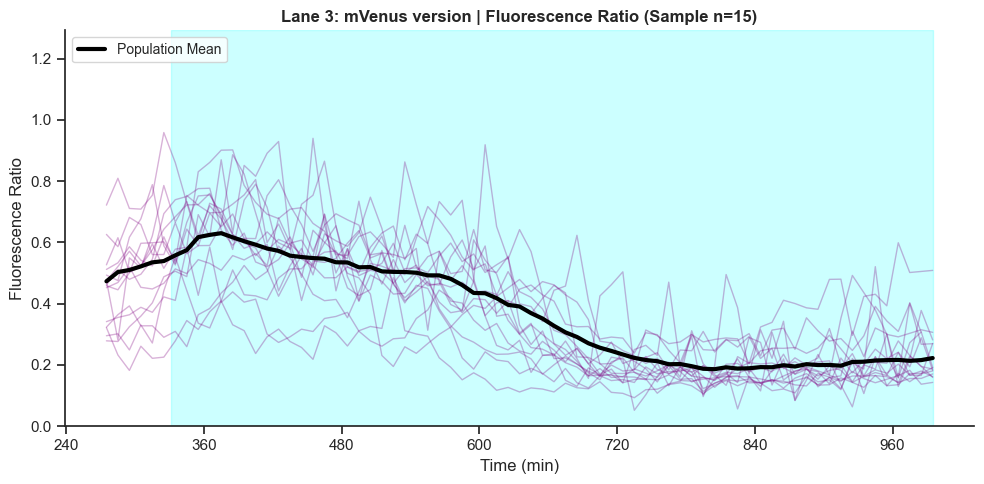

In [33]:
# -- CONFIGURATION: Number of mother_ids to plot --
SAMPLE_SIZE = 15  

print("GFP/mScarlet-I3")
plot_individual_traces_by_lane(locals().get('mother_machine_data'), SHADING_REGIONS, RATIO_CONFIG_GFP, sample_size=SAMPLE_SIZE)

mVenus/mScarlet-I3


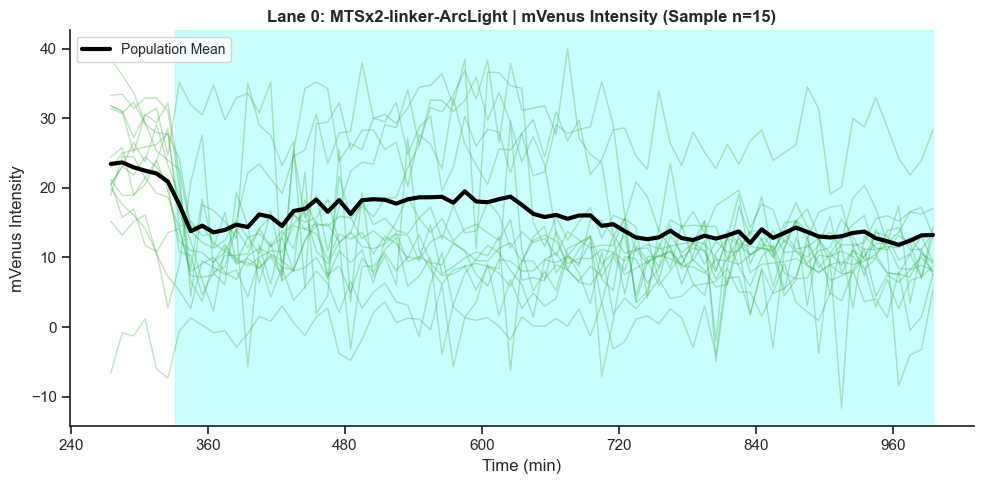

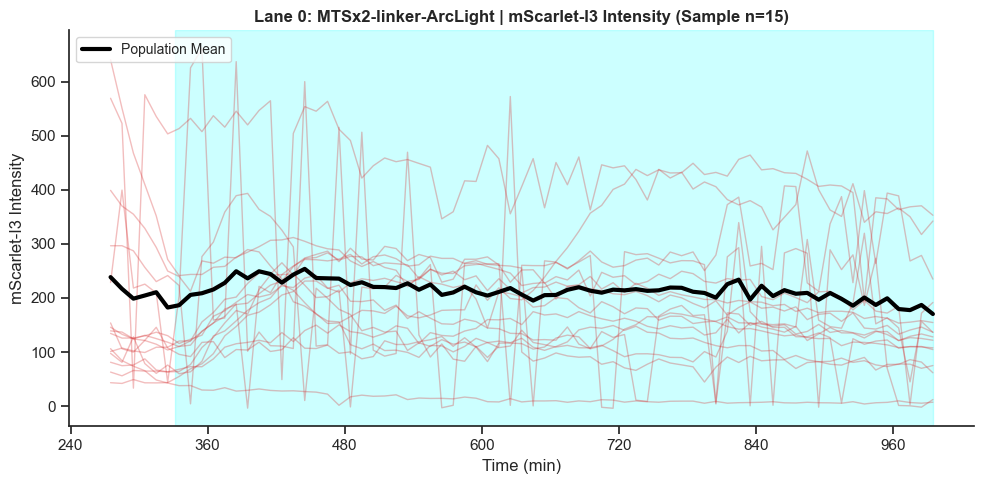

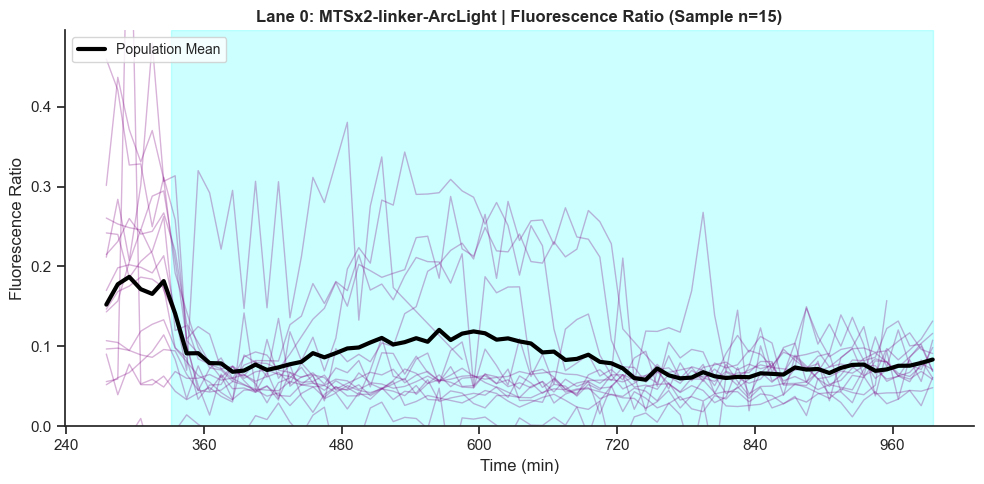

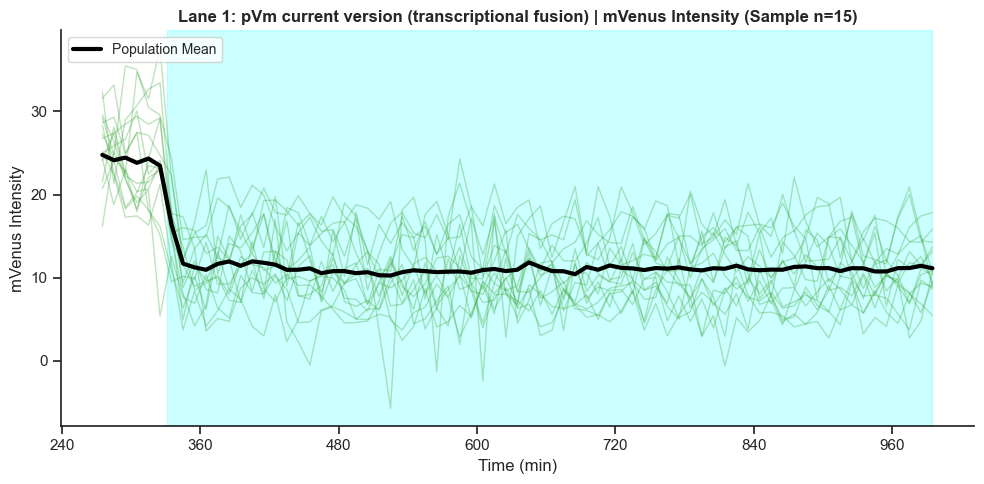

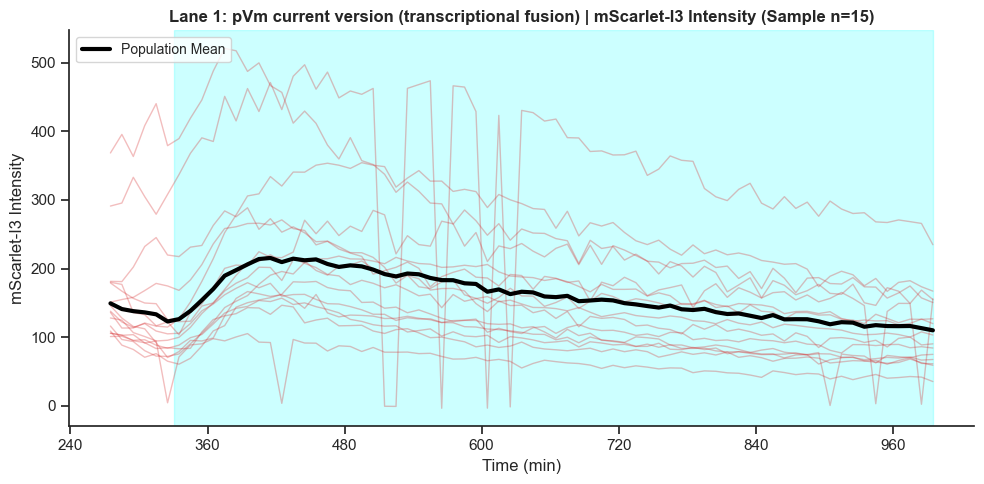

...

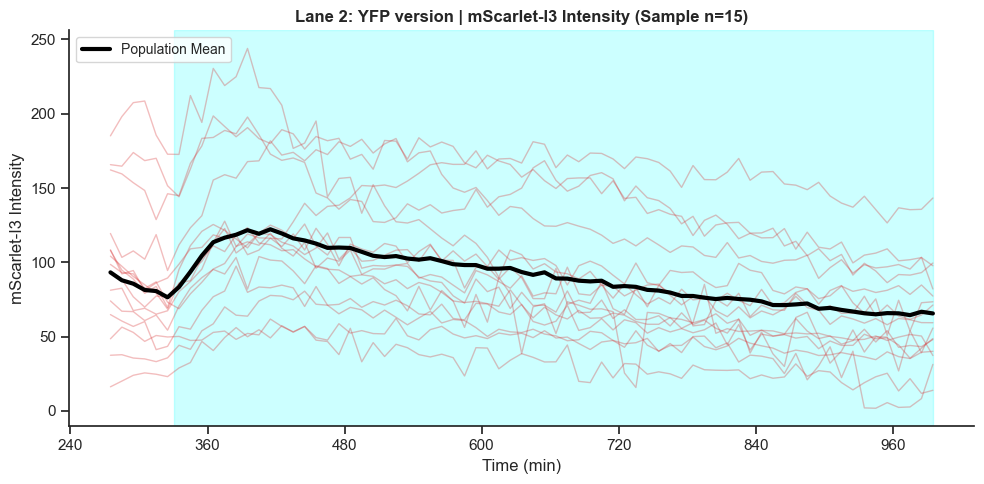

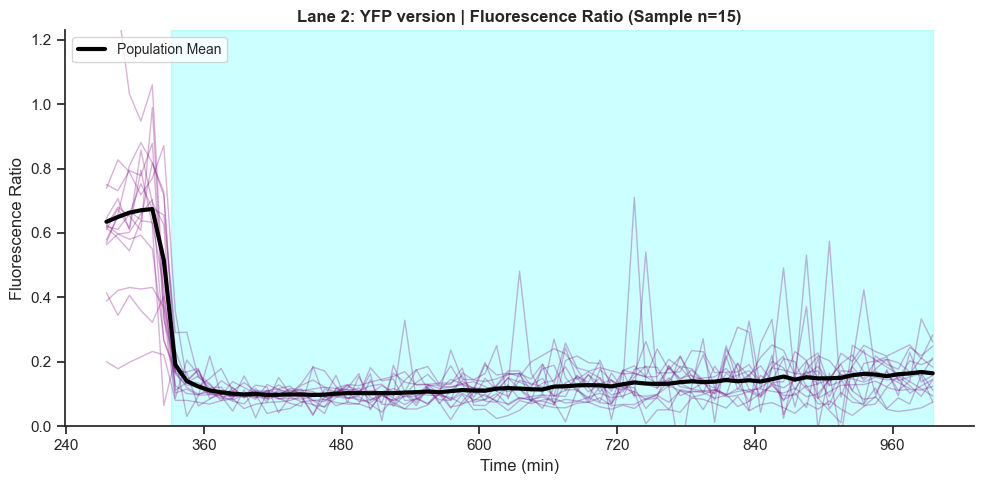

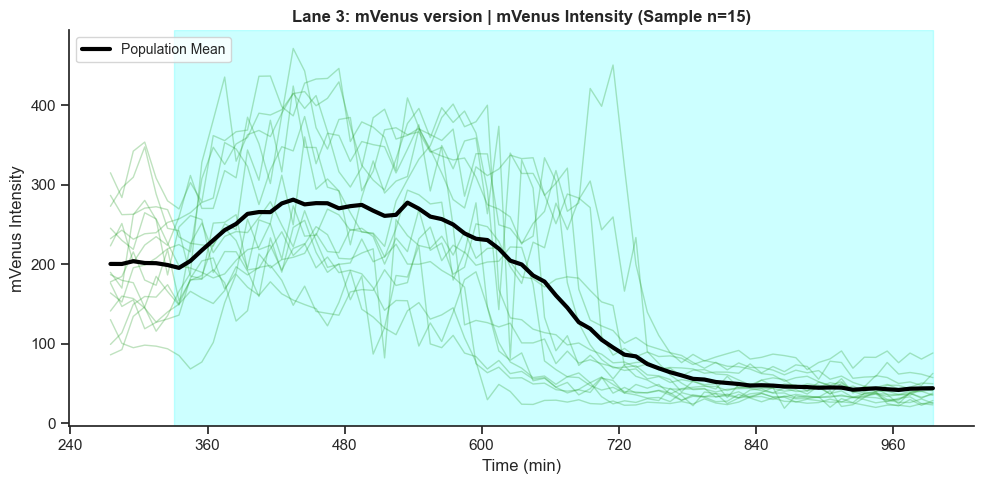

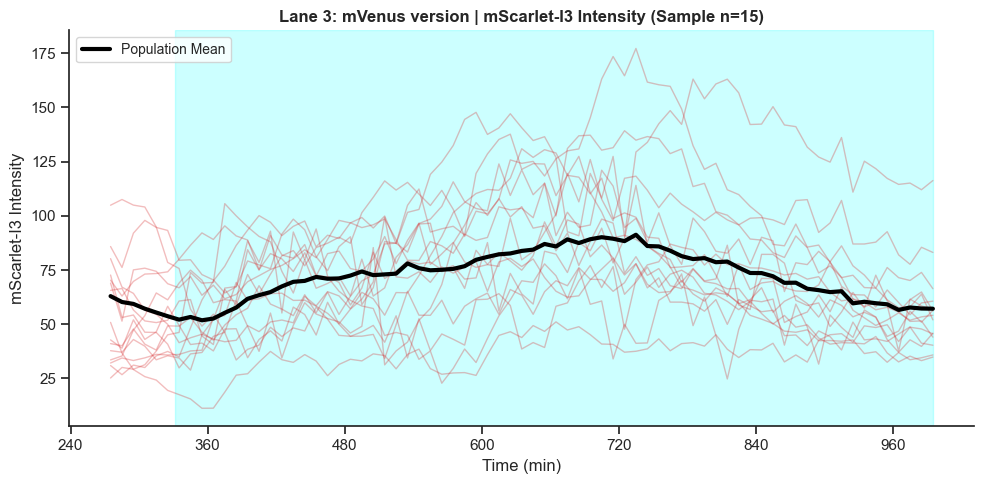

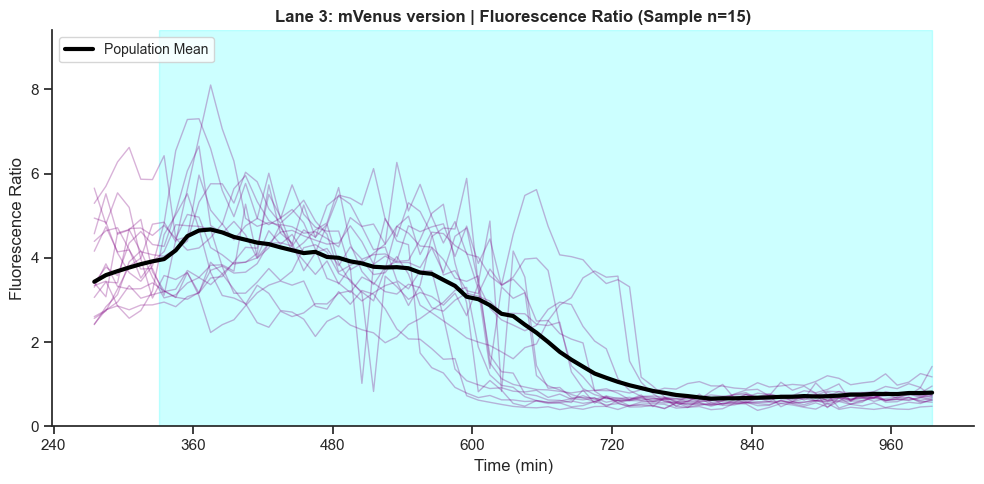

In [34]:
# -- CONFIGURATION: Number of mother_ids to plot --
SAMPLE_SIZE = 15  

print("mVenus/mScarlet-I3")
plot_individual_traces_by_lane(locals().get('mother_machine_data'), SHADING_REGIONS, RATIO_CONFIG_mVenus, sample_size=SAMPLE_SIZE)

### Single-cell traces with LOWESS smoothing of individual traces

GFP/mScarlet-I3


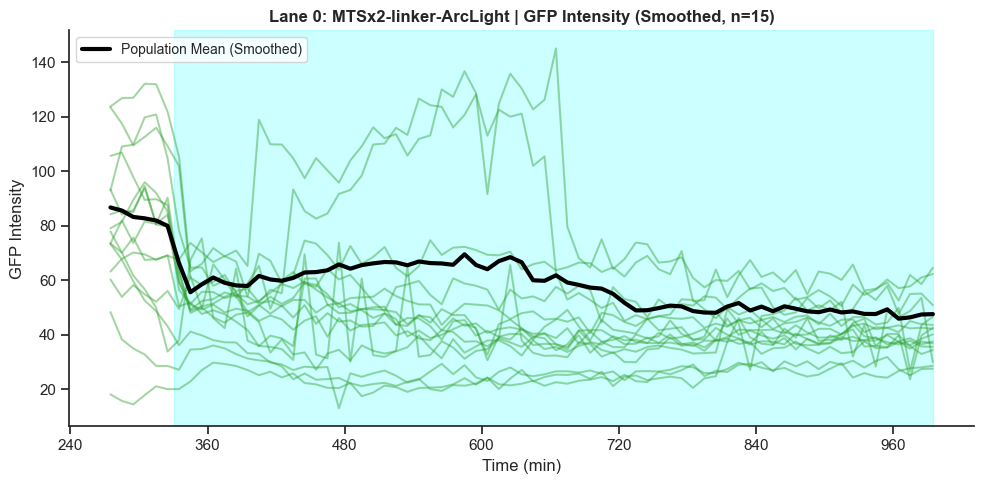

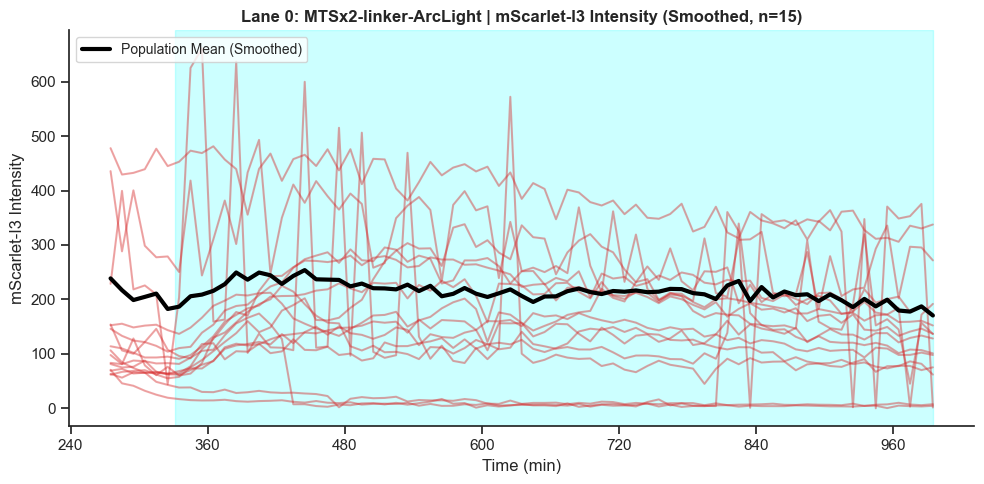

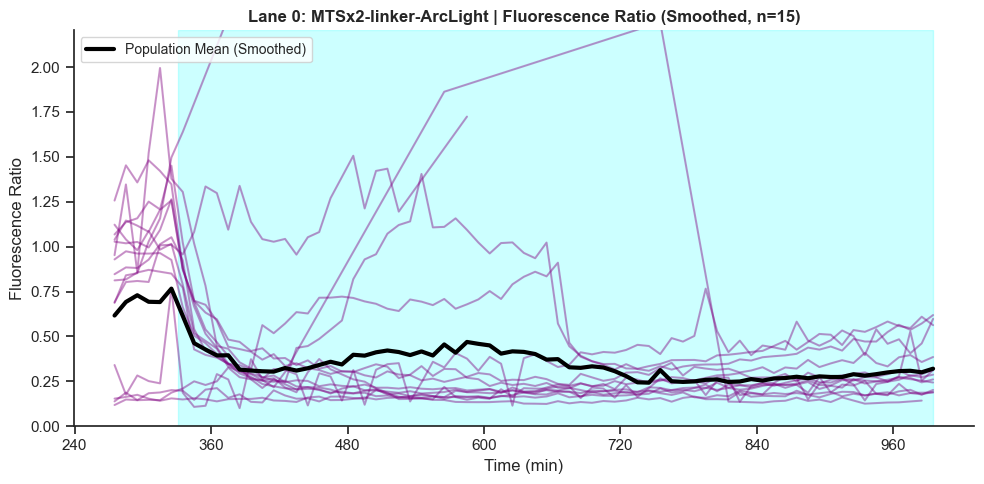

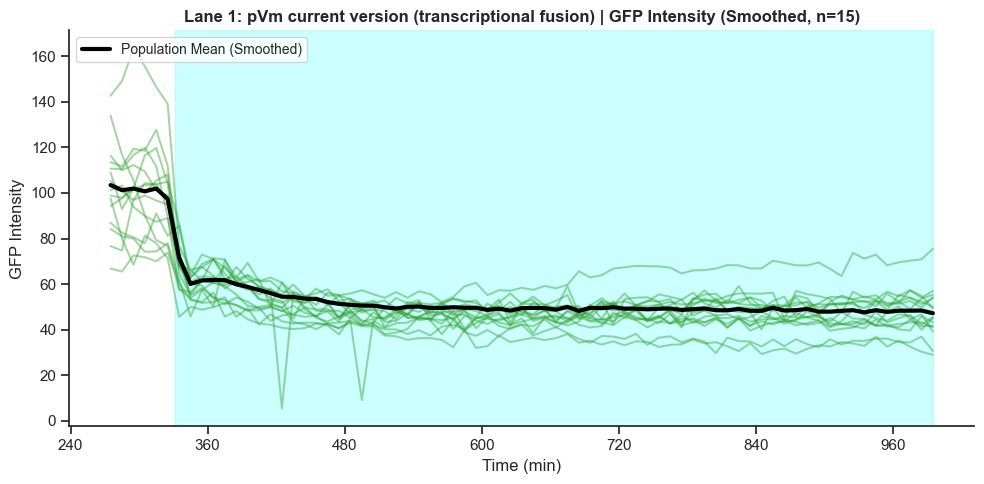

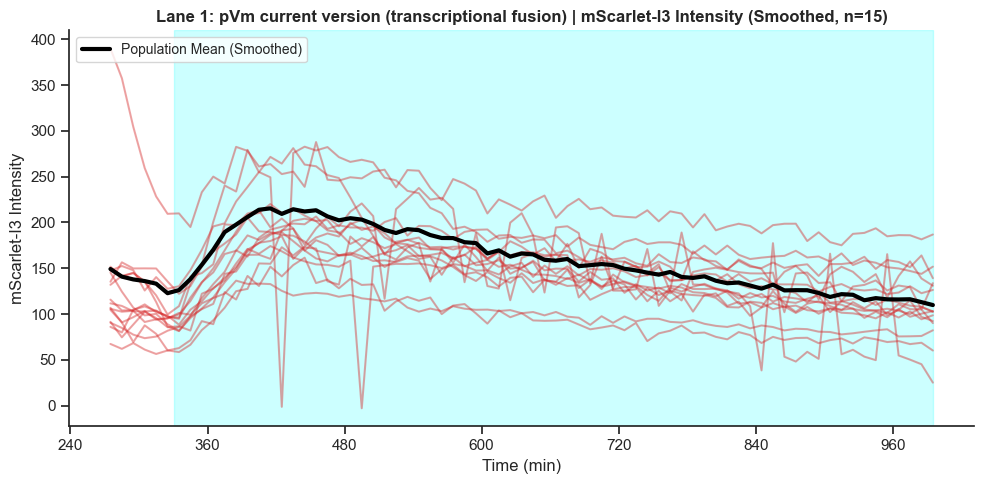

...

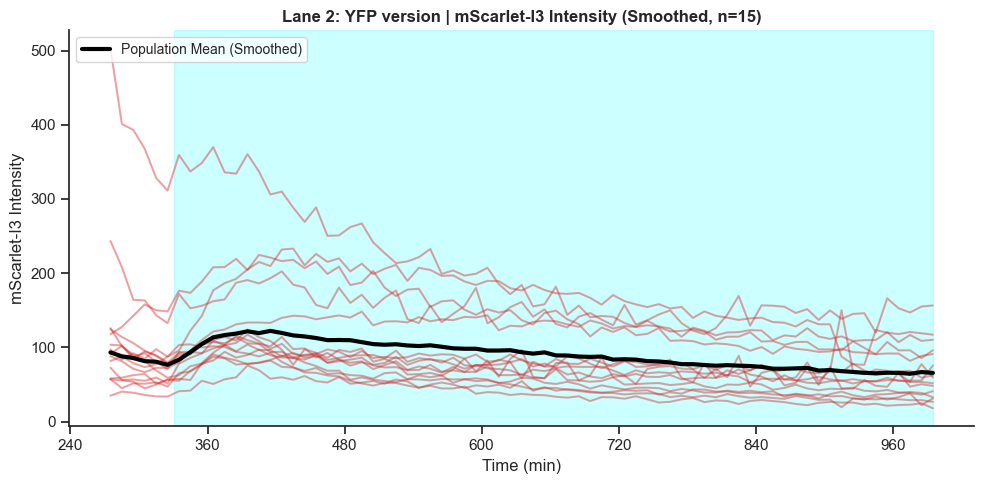

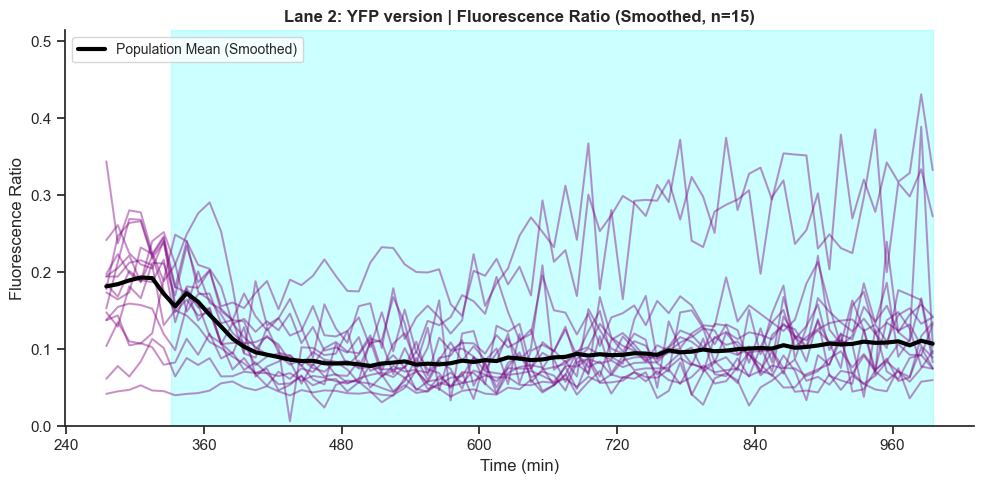

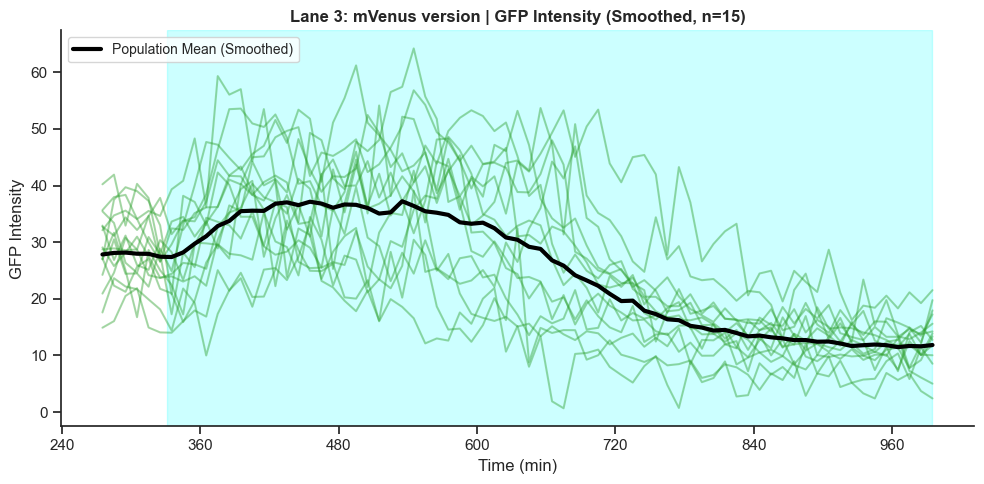

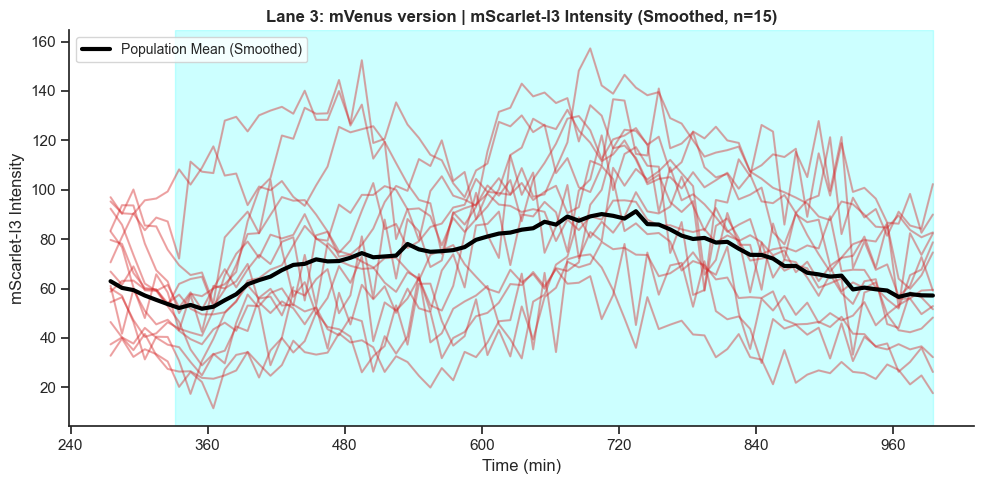

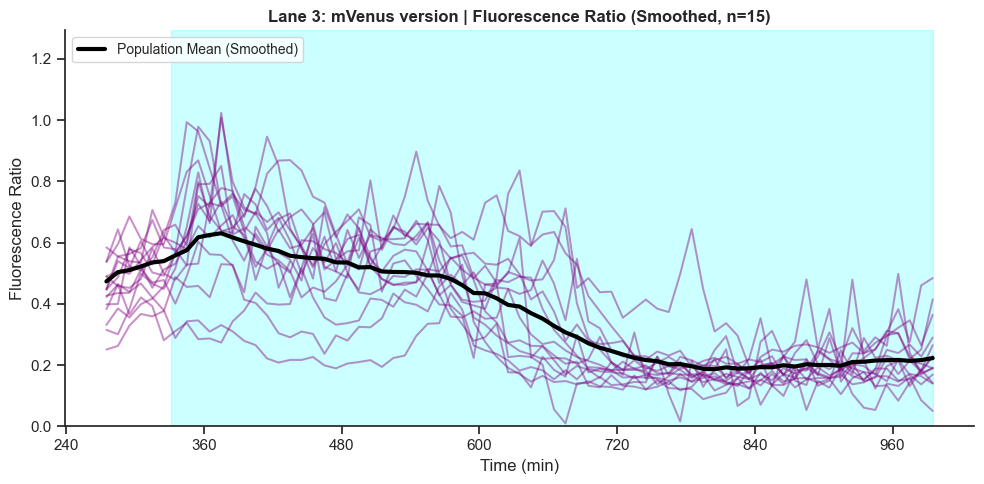

In [35]:
# -- CONFIGURATION: Number of mother_ids to plot & LOWESS fraction --
SAMPLE_SIZE = 15  
LOWESS_FRAC = 0.05  # Fraction of timepoints used for LOWESS smoothing (0 to 1)

print("GFP/mScarlet-I3")
plot_individual_traces_by_lane_smoothed(locals().get('mother_machine_data'), SHADING_REGIONS, RATIO_CONFIG_GFP, sample_size=SAMPLE_SIZE, lowess_frac=LOWESS_FRAC)

mVenus/mScarlet-I3


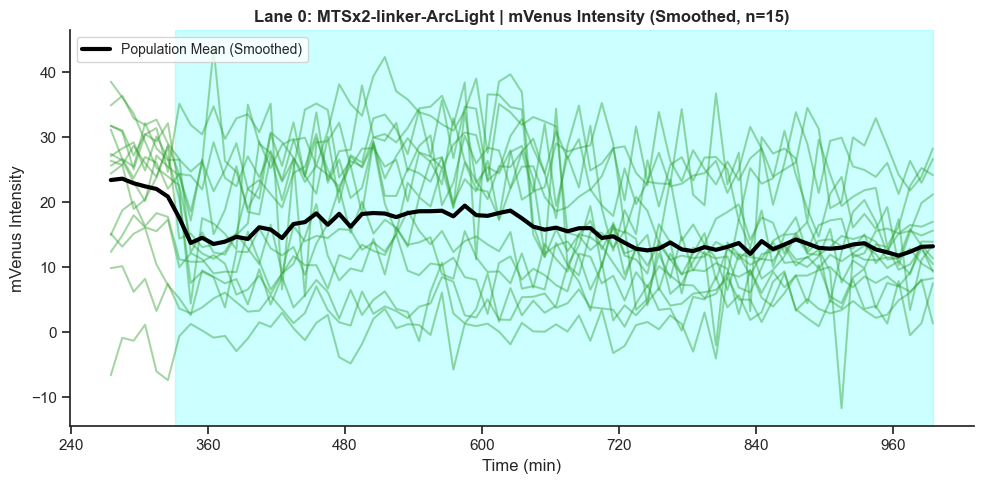

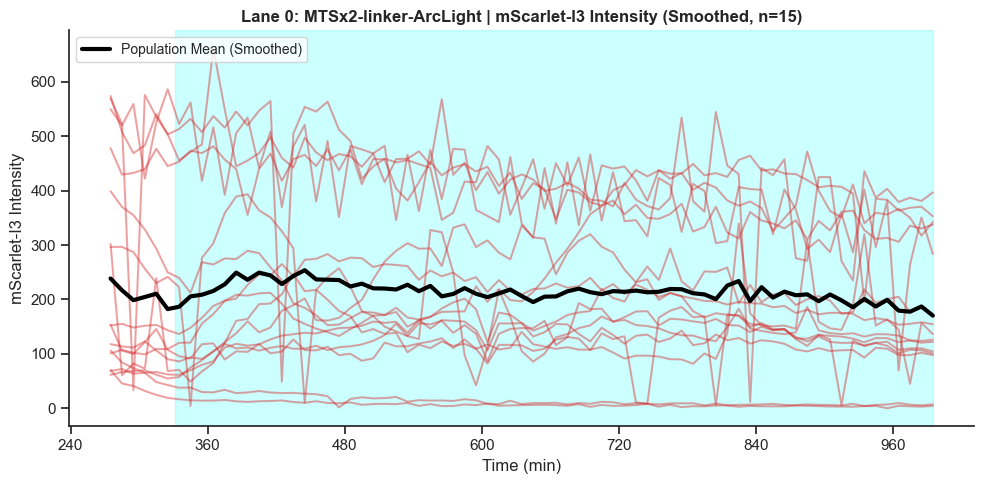

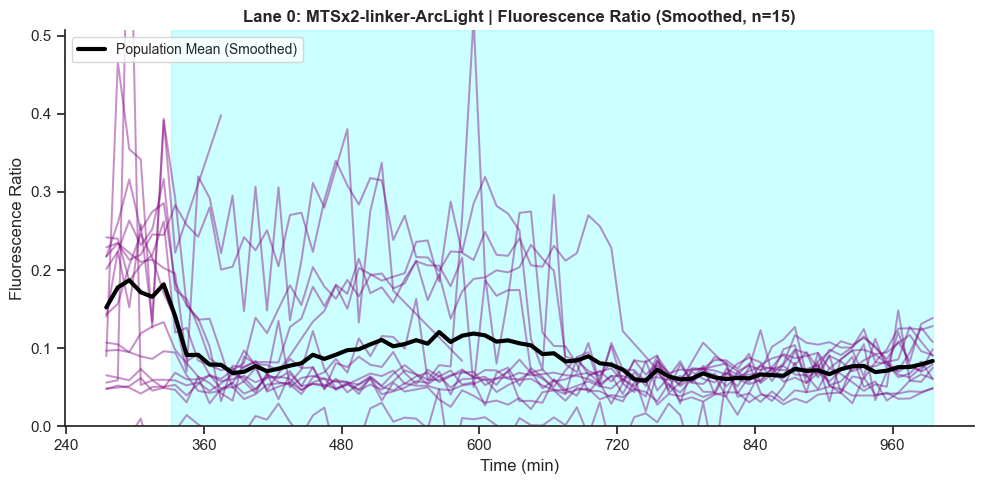

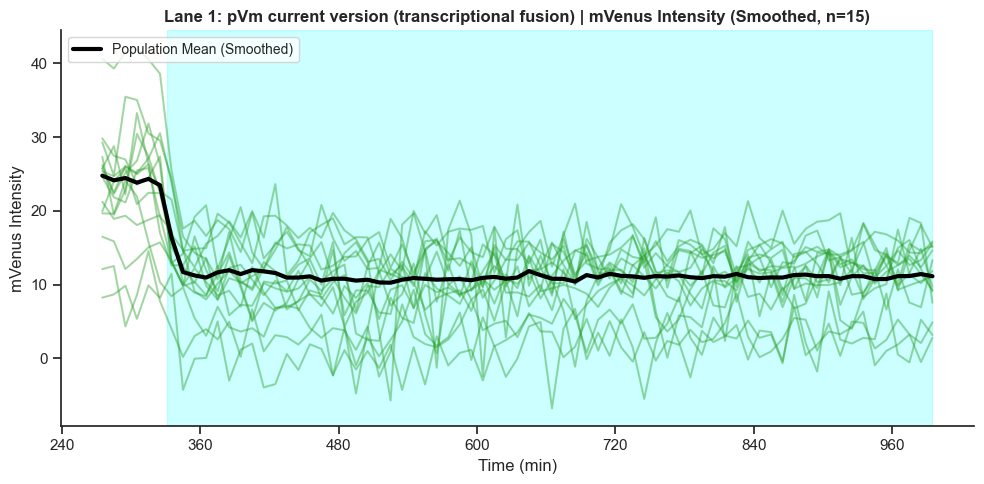

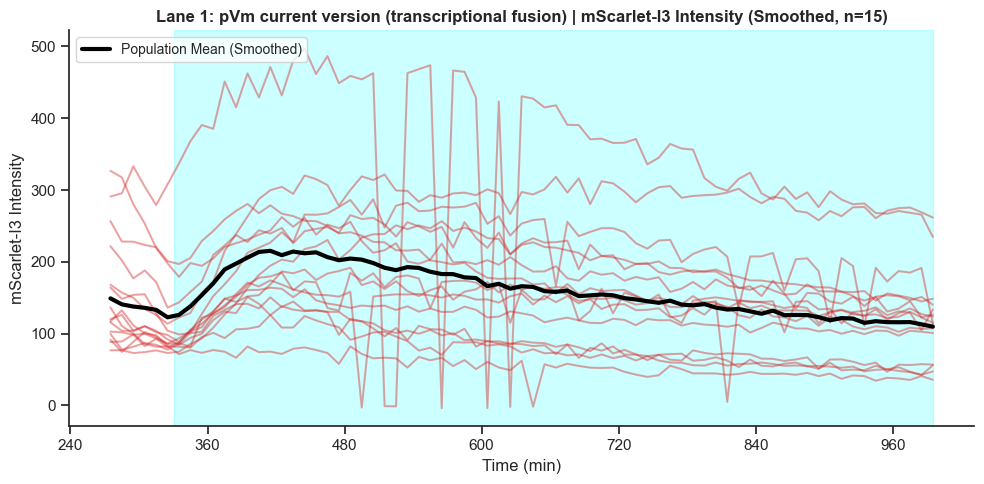

...

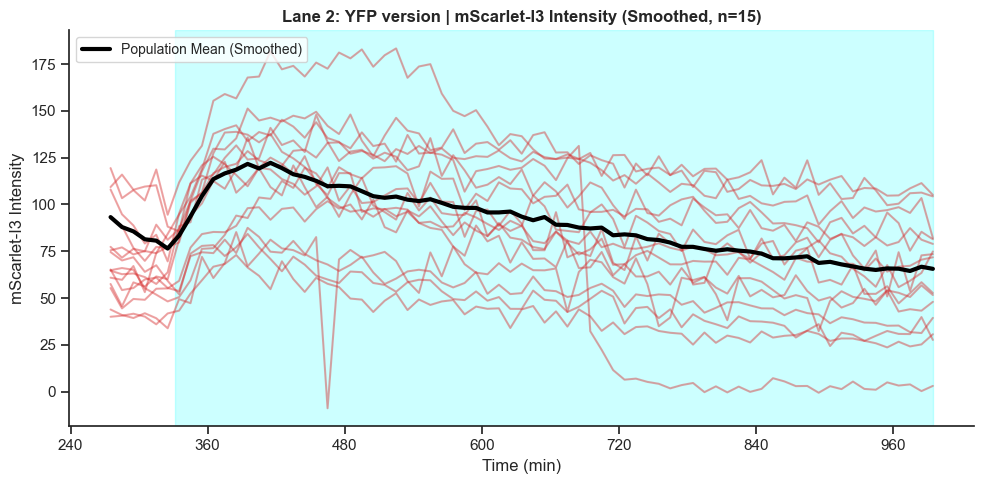

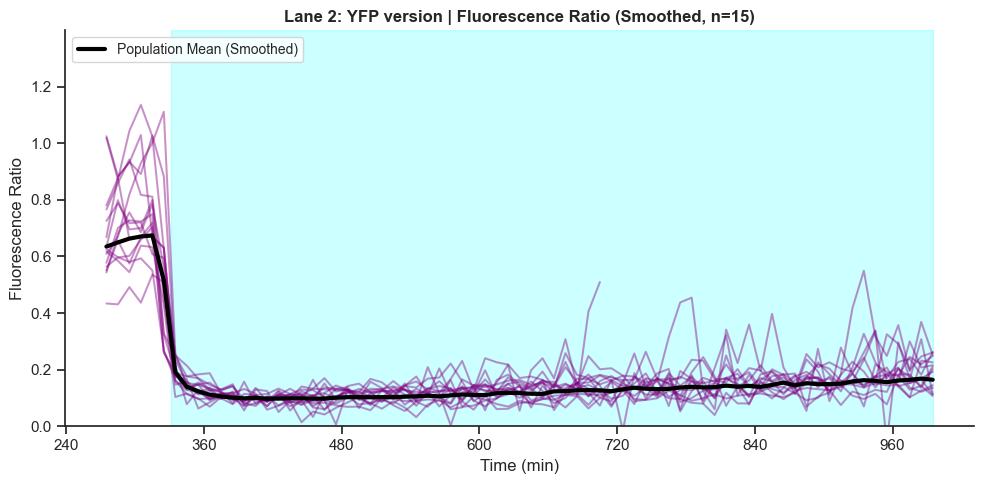

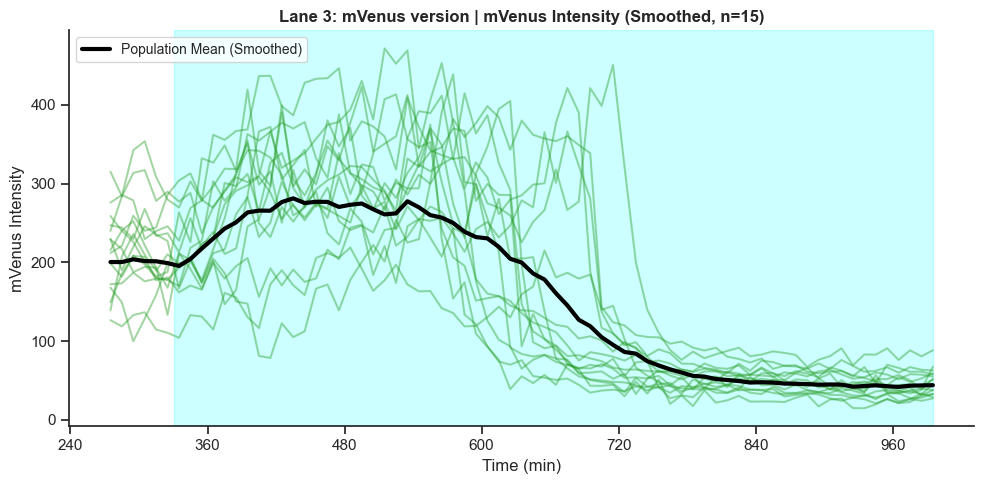

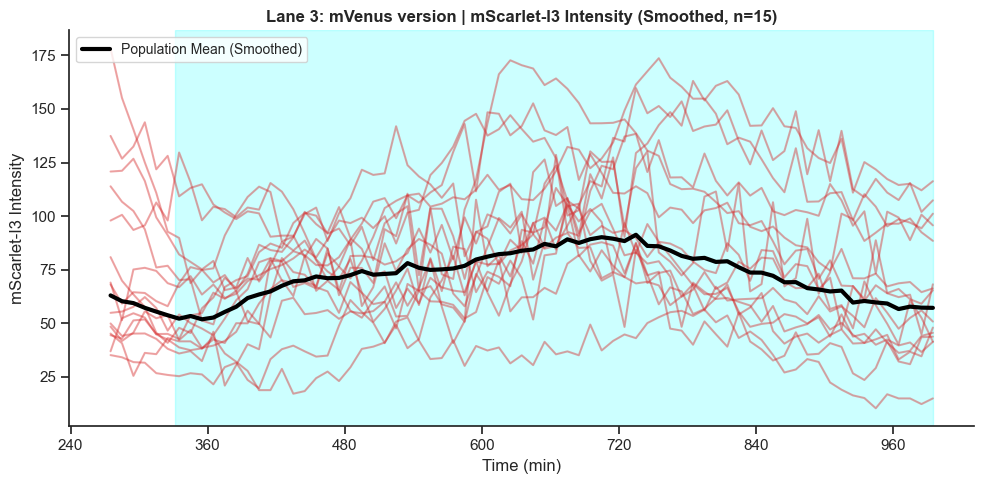

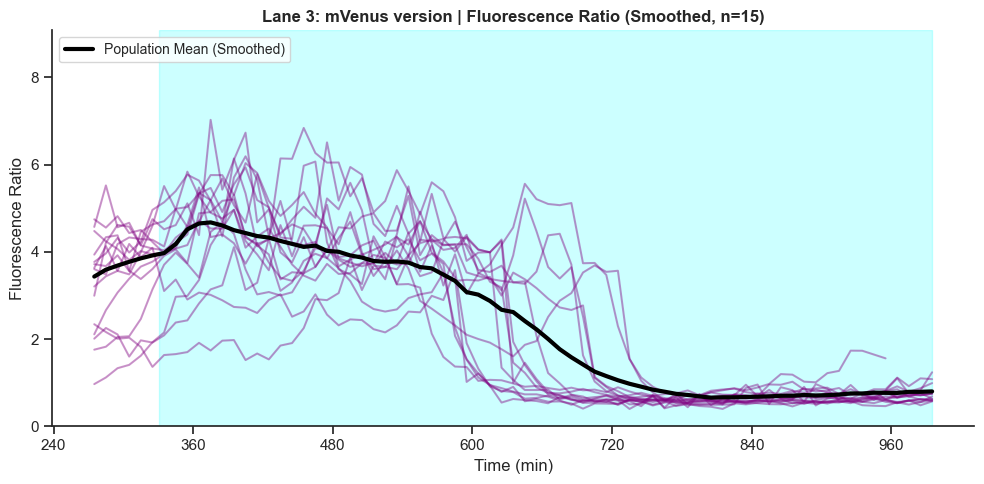

In [36]:
# -- CONFIGURATION: Number of mother_ids to plot & LOWESS fraction --
SAMPLE_SIZE = 15  
LOWESS_FRAC = 0.05  # Fraction of timepoints used for LOWESS smoothing (0 to 1)

print("mVenus/mScarlet-I3")
plot_individual_traces_by_lane_smoothed(locals().get('mother_machine_data'), SHADING_REGIONS, RATIO_CONFIG_mVenus, sample_size=SAMPLE_SIZE, lowess_frac=LOWESS_FRAC)

### Single-cell plots to PDF

In [38]:
# -- CONFIGURATION --
SAMPLE_SIZE = 15  
LOWESS_FRAC = 0.1
RANDOM_SEED = 42
PDF_FILENAME = "single_cell_fluorescence_plots_raw_and_smoothed_GFP.pdf"

# -- Y-AXIS CONFIGURATION --
# Keys must match the channel names in RATIO_CONFIG
Y_LIMITS = {
    'GFP': None,
    'mScarlet-I3': (0, 200),
    'ratio': None
}

generate_single_cell_report(locals().get('mother_machine_data'), PDF_FILENAME, ratio_config=RATIO_CONFIG_GFP, sample_size=SAMPLE_SIZE, lowess_frac=LOWESS_FRAC, seed=RANDOM_SEED, y_limits=Y_LIMITS)

Generating plots for Lane 0 (MTSx2-linker-ArcLight)...
Generating plots for Lane 1 (pVm current version (transcriptional fusion))...
Generating plots for Lane 2 (YFP version)...
Generating plots for Lane 3 (mVenus version)...
Report saved: single_cell_fluorescence_plots_raw_and_smoothed_GFP.pdf


In [39]:
# -- CONFIGURATION --
SAMPLE_SIZE = 15  
LOWESS_FRAC = 0.1
RANDOM_SEED = 42
PDF_FILENAME = "single_cell_fluorescence_plots_raw_and_smoothed_mVenus.pdf"

# -- Y-AXIS CONFIGURATION --
# Keys must match the channel names in RATIO_CONFIG
Y_LIMITS = {
    'mVenus': None,
    'mScarlet-I3': (0, 200),
    'ratio': None
}

generate_single_cell_report(locals().get('mother_machine_data'), PDF_FILENAME, ratio_config=RATIO_CONFIG_mVenus, sample_size=SAMPLE_SIZE, lowess_frac=LOWESS_FRAC, seed=RANDOM_SEED, y_limits=Y_LIMITS)

Generating plots for Lane 0 (MTSx2-linker-ArcLight)...
Generating plots for Lane 1 (pVm current version (transcriptional fusion))...
Generating plots for Lane 2 (YFP version)...
Generating plots for Lane 3 (mVenus version)...
Report saved: single_cell_fluorescence_plots_raw_and_smoothed_mVenus.pdf


In [40]:
#

# End

In [8]:
#